# Human Tumor Analysis


In [1]:
import mazebox as mb
import scvelo as scv
import scanpy as sc
import os.path as op
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

ModuleNotFoundError: No module named '_settings'

# Preprocessing

## Read in Files

In [3]:
indir = "../data/loom/"

samples = ['236D_236D_V300044428','3359-PK-1-GCCAAT-ATCAGT_S1_L001']
[a1,a2] = [mb.pp.read_loom(sample, indir) for sample in samples]


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


## Filter and concatenate

In [4]:
tfs = ['SP100', 'FOSL1', 'HES1', 'NFKBIZ', 'RELB', 'EPAS1', 'BCL3', 'REST', 'SP110', 'NFKB2', 'TEAD2', 'HMG20B', 'SIX5',
       'RARG', 'TEAD4', 'ZNF217', 'SP140L', 'SOX18', 'HOXC13', 'STAT6', 'ETV4', 'KLF2', 'MITF', 'NR0B2', 'ASCL1', 'ZBTB7C', 'ELF3',
       'RORC', 'FOXA2', 'ETS2','TOX3', 'XBP1', 'ST18', 'FOXA1', 'OVOL2', 'ZNF664', 'TBX10', 'PROX1', 'ETV6', 'CEBPD', 'TFCP2L1', 'FOXJ3',
       'ZNF407', 'ZNF511','ZNF396', 'RBPJ', 'ZSCAN31', 'HOXB5', 'ZNF3', 'TSHZ2', 'ZBTB16', 'ZNF10', 'FLI1', 'GATA4', 'NR0B1', 'NHLH1',
       'NEUROD6', 'ZNF581', 'TCF15', 'LYAR', 'ISL2', 'OLIG2', 'NEUROD1', 'INSM1', 'PAX5', 'SP6', 'MYT1', 'HES6', 'ZNF24', 'ISL1', 'ZNF397',
       'SOX11', 'ZNF253', 'SMAD4', 'RBP1', 'ONECUT2', 'ZNF711', 'DLX5', 'GRIP1', 'ZNF157', 'ZNF713', 'ZNF136', 'FOXN4', 'PATZ1', 'ZNF491',
       'ZBTB21', 'KLF12', 'ZNF501', 'ZNF785', 'CXXC1', 'ZNF324', 'ZNF764', 'ZBTB18', 'KAT8', 'ZNF334', 'POU4F1', 'ZNF250', 'ZNF132',
       'SALL2', 'DLX6', 'MBD1','SOX1', 'ZFP3', 'ZNF543', 'POU2F1', 'NONO', 'SMAD9', 'ZKSCAN2', 'TCF12', 'VEZF1', 'TOX', 'BHLHE22', 'MTA1',
       'TCF3', 'SCRT2', 'RFX7','NHLH2', 'SCRT1', 'RCOR2', 'PURG', 'TBPL1', 'TCF4', 'EBF1', 'ZNF749', 'NEUROD2', 'ZNF423', 'BACH2', 'GLI1',
       'ZFP64','NKX2-1', 'MYC', 'YAP1', 'POU2F3', 'MYCL', 'MYCN', 'ASCL2', 'AVIL', 'CHAT', 'GFI1B',
      'CHGA','EPCAM']


Dropkick is a tool to get rid of empty and low-quality droplets based on ambient reads. It should be applied to each sample separately, so we will apply first and then concantenate the data into one AnnData object.

In [14]:
batch_categories = ['Tumor 1','Tumor 2']
batch_key = 'tumor'

adata = a1.concatenate(a2, batch_key=batch_key, batch_categories=batch_categories)




In [15]:
adata = mb.pp.scanpy_recipe(adata, retain_genes=tfs,)

Filtered out 28364 genes that are detected in less than 3 cells (spliced).
Normalized count data: X, spliced, unspliced.
Logarithmized X.


## Cell Cycle Regression

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


... storing 'phase' as categorical


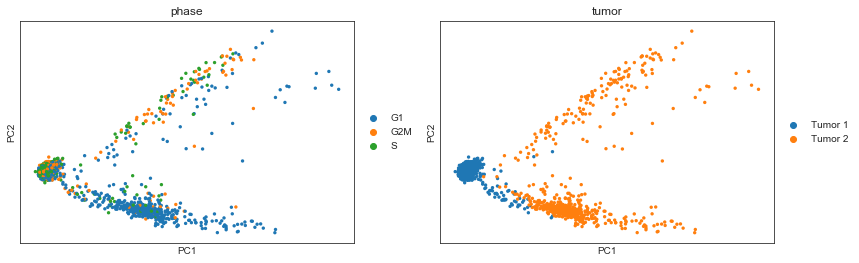

In [18]:
sc.pp.scale(adata)
scv.tl.score_genes_cell_cycle(adata)
sc.tl.pca(adata)
sc.pl.pca_scatter(adata, color=['phase','tumor'])

In [19]:
sc.pp.regress_out(adata, ['S_score', 'G2M_score'])
sc.pp.scale(adata)

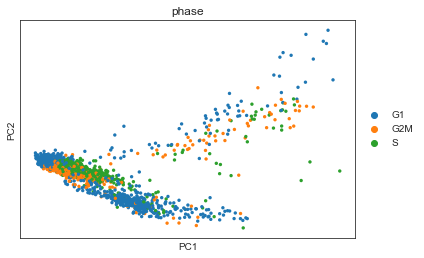

In [20]:
sc.tl.pca(adata)
sc.pl.pca_scatter(adata, color='phase')

# Dimensionality Reduction and RNA Velocity

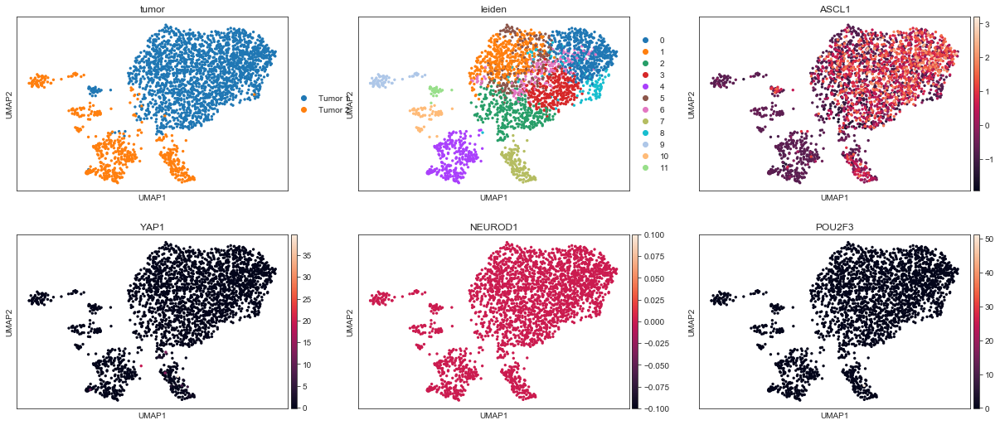

In [21]:
import matplotlib.pyplot as plt
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata, random_state = 1)
sc.pl.umap(adata, color = ['tumor','leiden','ASCL1','YAP1','NEUROD1','POU2F3'], ncols = 3)


In [22]:
adata.write_h5ad('../int/tumor/adata01.h5ad')

In [2]:
adata = sc.read_h5ad('../int/tumor/adata01.h5ad')

## Calculating Velocity

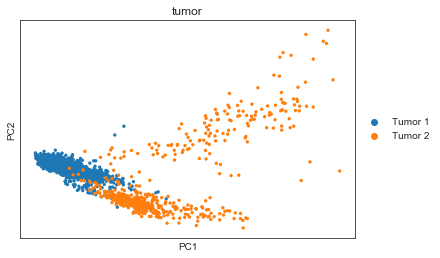

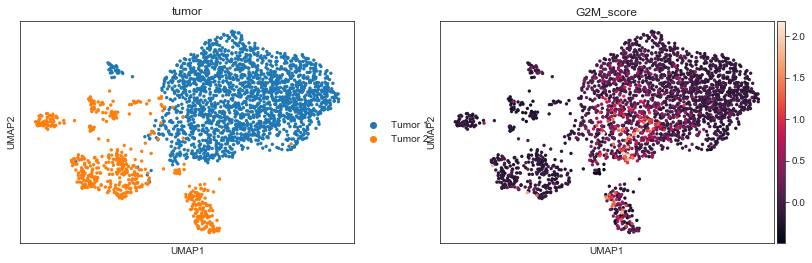

In [7]:
sc.pp.neighbors(adata, random_state=1) #recalculating after subsetting data and cell cycle correction)
sc.tl.pca(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata, random_state=1)
sc.pl.pca(adata, color = 'tumor')
sc.pl.umap(adata, color = ['tumor','G2M_score'])


In [13]:
scv.pp.moments(adata)
scv.tl.velocity(adata, mode = 'deterministic', groupby='tumor')
scv.tl.velocity_graph(adata)


computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:14) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


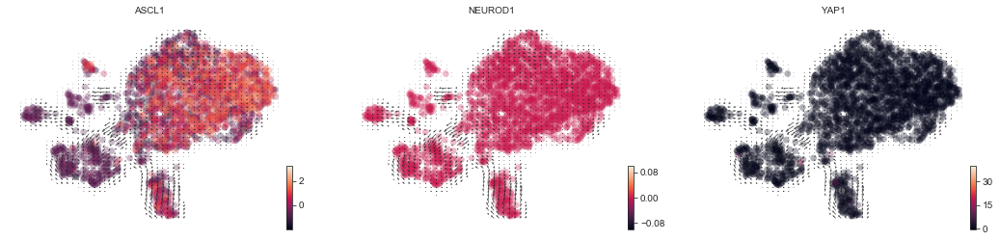

In [14]:
scv.pl.velocity_embedding_grid(adata, basis = 'umap', color = ['ASCL1','NEUROD1','YAP1'], 
                               figsize = (6,4), alpha=.3, smooth =True)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)


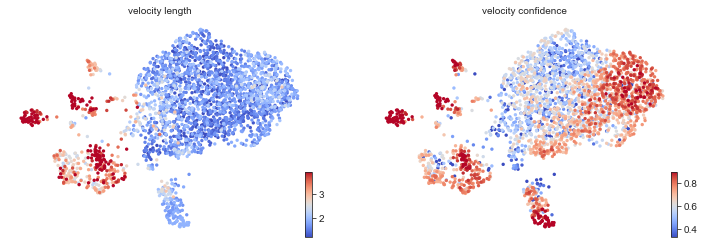

In [15]:
scv.tl.velocity_confidence(adata)

keys = 'velocity_length', 'velocity_confidence'  
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95], basis = 'umap')

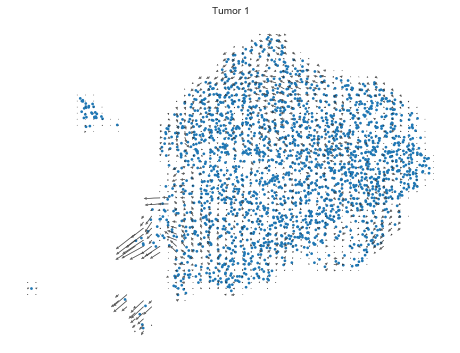

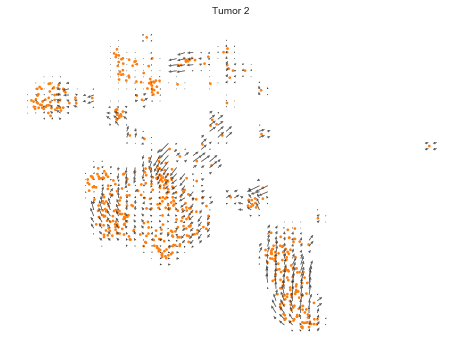

In [16]:
for g in adata.obs['tumor'].cat.categories:
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot()
    scv.pl.velocity_embedding_grid(adata[adata.obs['tumor']==g], basis = 'umap', ax = ax, show = False, color = 'tumor', size = 30, alpha = 1, vmax = 4, vmin = 0, title = g)


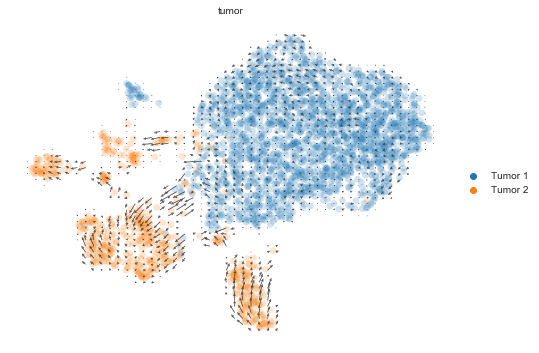

In [17]:
scv.pl.velocity_embedding_grid(adata, basis = 'umap', figsize = (8,6), legend_loc = 'on right',color = 'tumor')


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


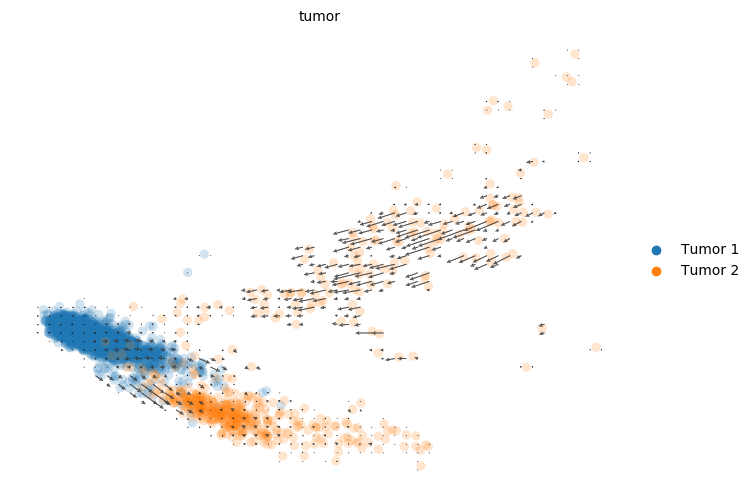

In [7]:
scv.pl.velocity_embedding_grid(adata, basis = 'pca', figsize = (8,6), legend_loc = 'on right',color = 'tumor')


Let's save the data at this point.

In [18]:
adata.write_h5ad('../int/tumor/adata02.h5ad')

In [2]:
adata = sc.read_h5ad('../int/tumor/adata02.h5ad')

# Pseudotime and plasticity

We would like to see if we can get the same results as Ireland et al. did for their pseudotime analysis. To run Monocle2, we need the R interface `rpy2`. We'll also use the pseudotime inference within scvelo for comparison.

In [19]:
scv.tl.terminal_states(adata, groupby='tumor')

computing terminal states
    identified 4 regions of root cells and 1 region of end points  (Tumor 1).
    identified 5 regions of root cells and 1 region of end points  (Tumor 2).
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


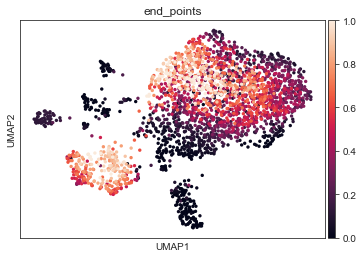

In [20]:
sc.pl.umap(adata, color="end_points")

### Velocity pseudotime

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


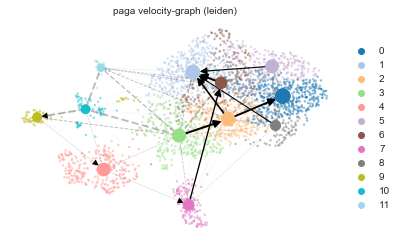

In [23]:
mb.ps.velocity_paga(adata, basis='umap')

In [24]:
adata.write_h5ad('../int/tumor/adata03.h5ad')

In [2]:
adata = sc.read_h5ad('../int/tumor/adata03.h5ad')

### Calculate plasticity using CTrP

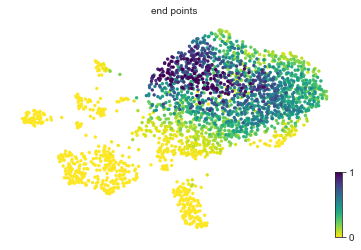

In [3]:
scv.pl.umap(adata, color = 'end_points')

In [4]:
mb.ps.ctrp(adata, self_transitions=False, adata_dist=None, groupby = 'tumor')

computing terminal states


Trying to set attribute `.obs` of view, copying.


Eigenvalues:  [0.9999995]
(2073, 1)
    identified 1 end points (Tumor 1)
Dropping absorbing rows for fundamental matrix...
(2028, 2028)
Calculating fate...
Calculating distances...
Calculating inner product...


Trying to set attribute `.obs` of view, copying.


Eigenvalues:  [1.0000046  0.99797297]
(564, 2)
    identified 2 end points (Tumor 2)
Dropping absorbing rows for fundamental matrix...
(550, 550)
Calculating fate...
Calculating distances...
Calculating inner product...


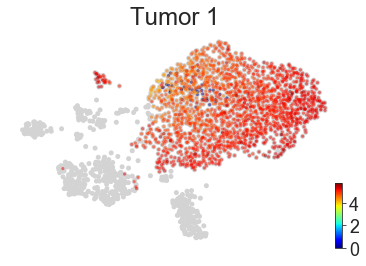

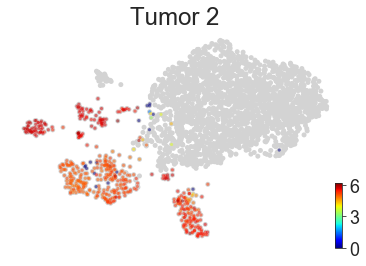

In [5]:
mb.pl.ctrp_groups(adata, groups = 'tumor', basis = 'umap')


Tumor 1 4.912190997338829
Tumor 2 5.156269653400852


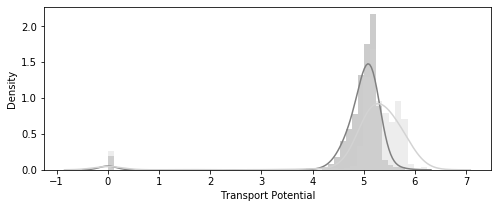

In [6]:
custom_palette = ['grey','lightgrey','#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']

mb.pl.ctrp_hist(adata, groups='tumor', bins = 50,figsize = (8,3), custom_palette=custom_palette,fname='tumor_hist_pheno')



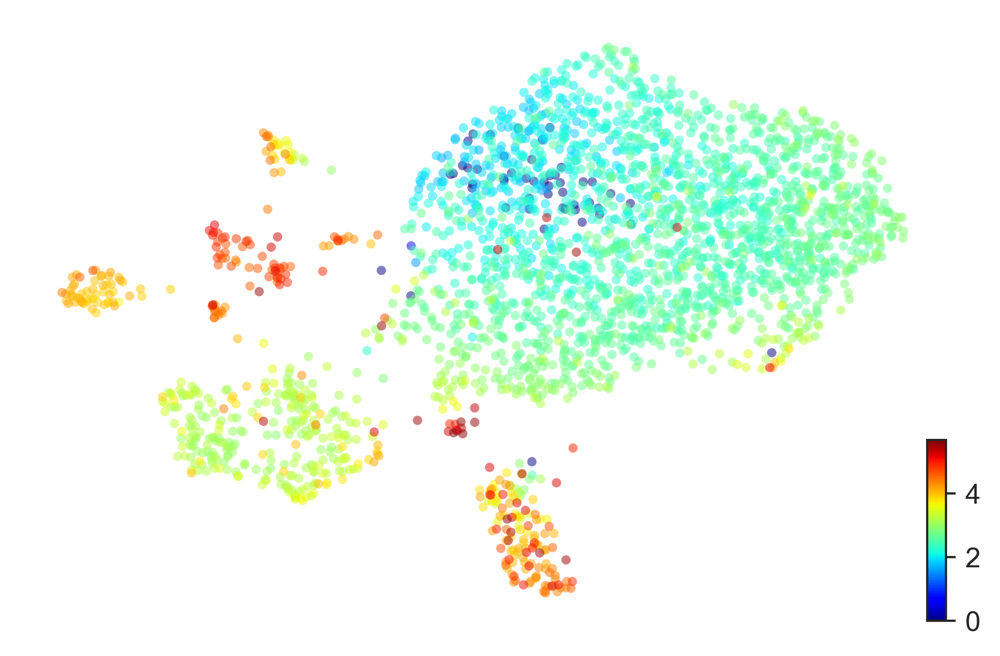

In [15]:
mb.pl.ctrp(adata, basis = 'umap')

In [34]:
adata.write_h5ad('../int/tumor/adata04.h5ad')

In [2]:
adata = sc.read_h5ad('../int/tumor/adata04.h5ad')

# Signature Subtyping

In [3]:
sig_matrix = pd.read_csv('../data/sig_matrix_ParTI.csv', header =0, index_col = 0)



Scoring individual cells...
(87, 5) (87, 2637)


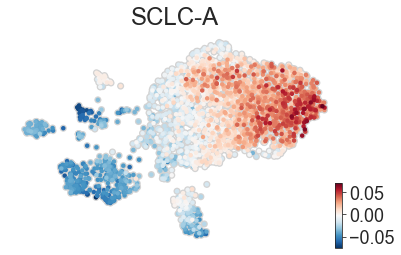

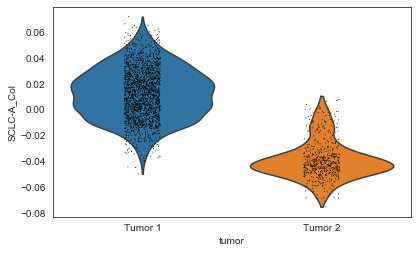

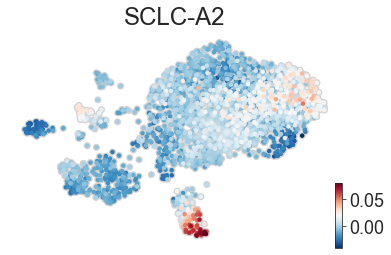

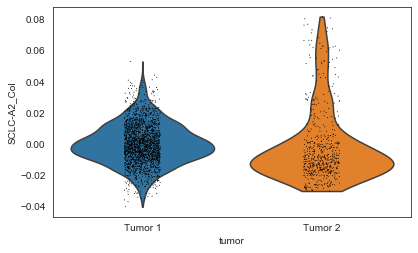

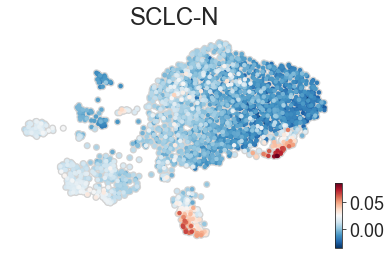

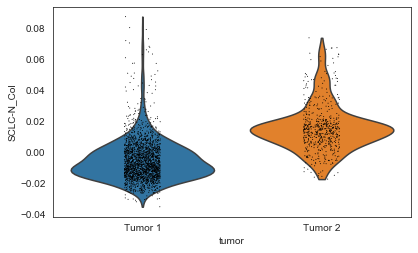

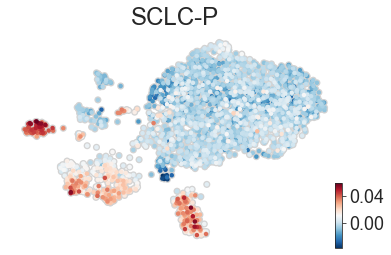

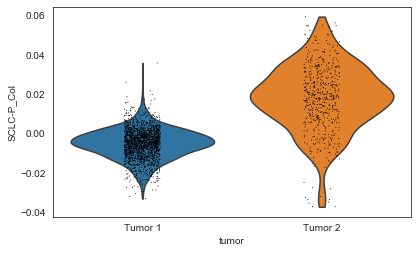

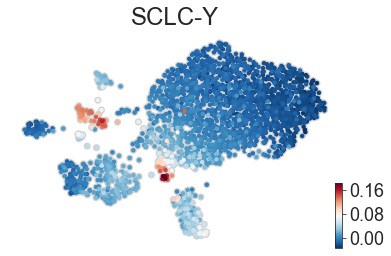

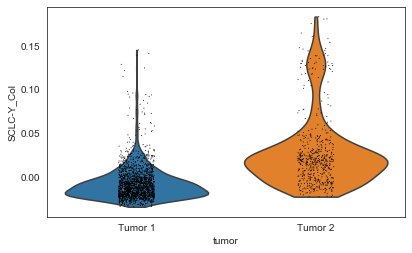

(87, 5) (87, 2637)


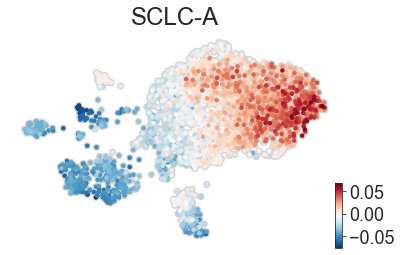

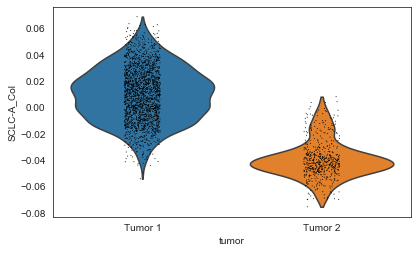

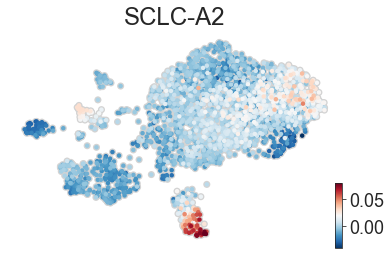

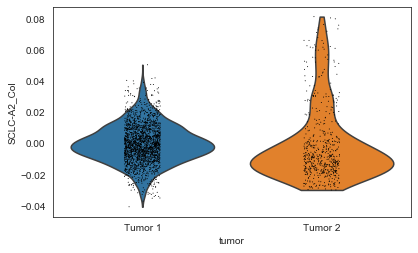

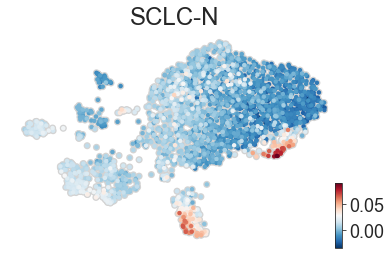

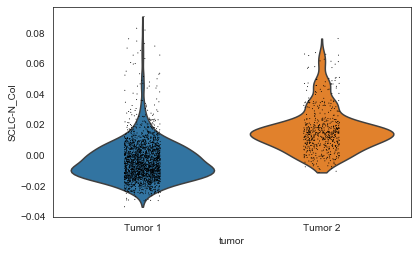

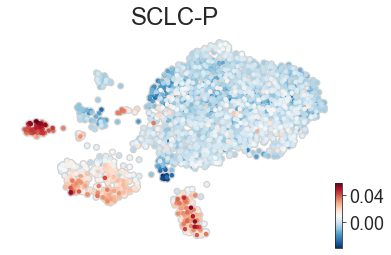

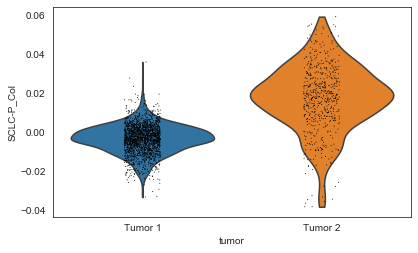

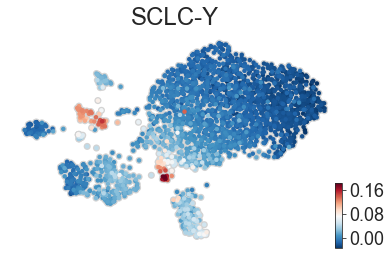

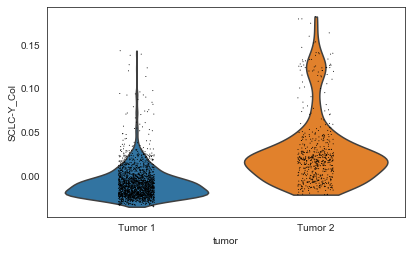

... storing 'Phenotype_unfiltered' as categorical


<Figure size 864x576 with 0 Axes>

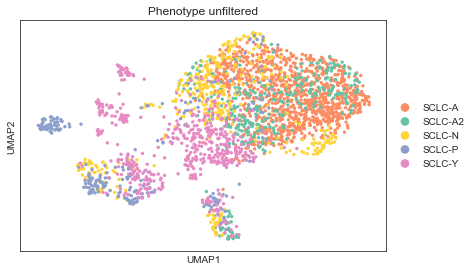

Generating background...
0
1
2
3
4


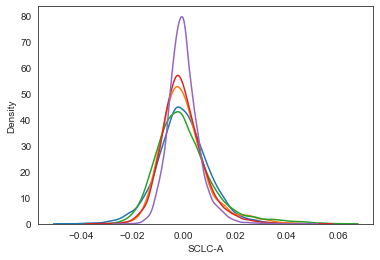

Correcting individual cell scores...


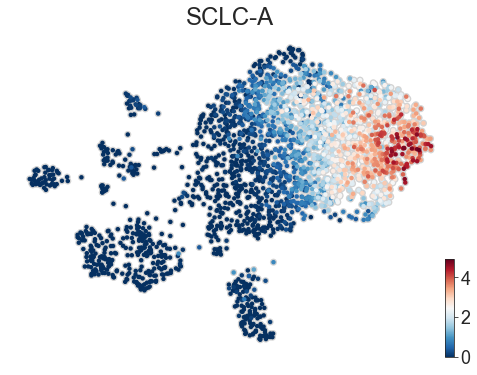

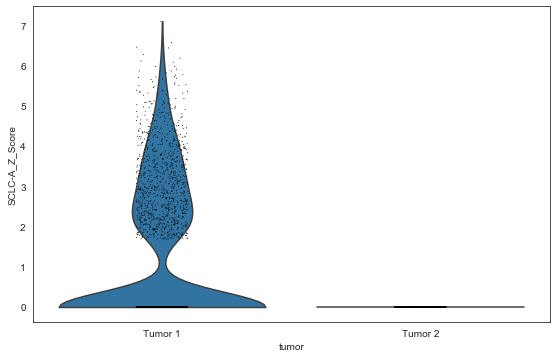

<Figure size 576x432 with 0 Axes>

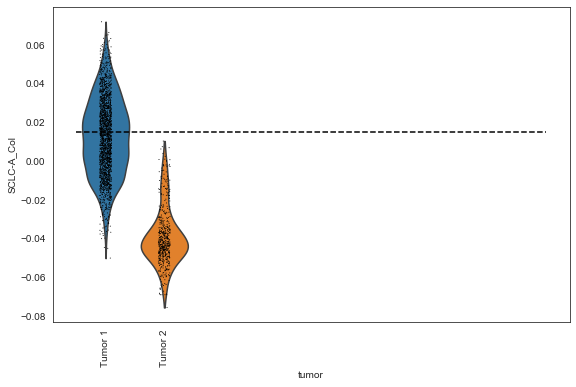

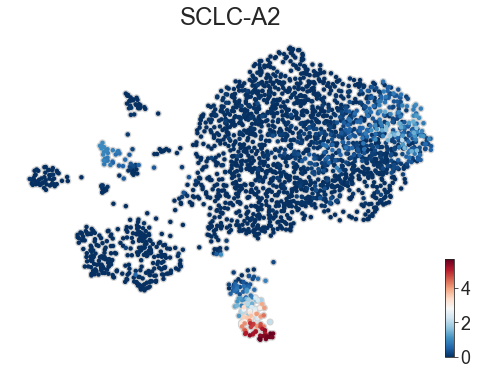

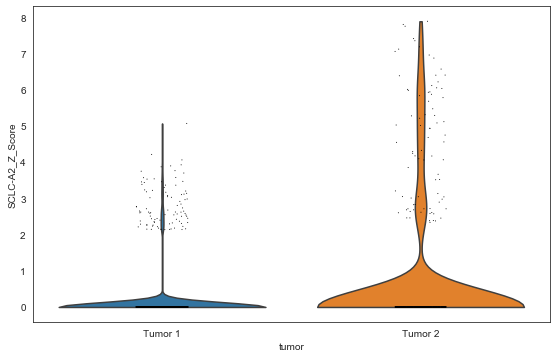

<Figure size 576x432 with 0 Axes>

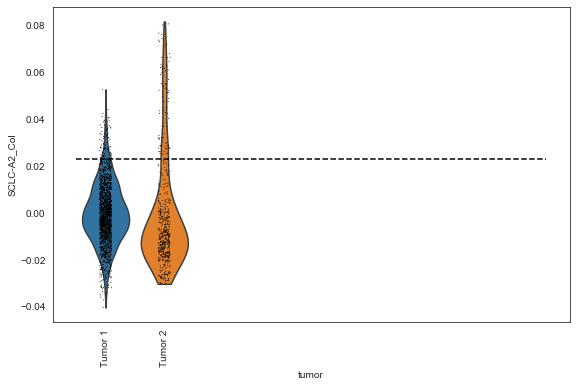

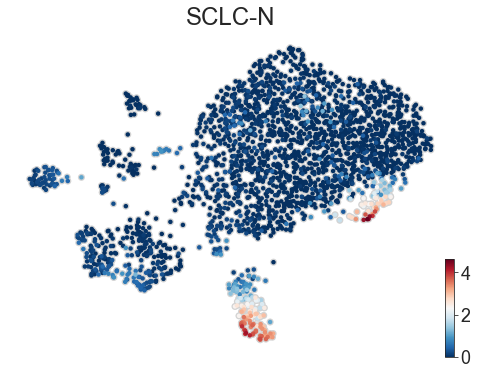

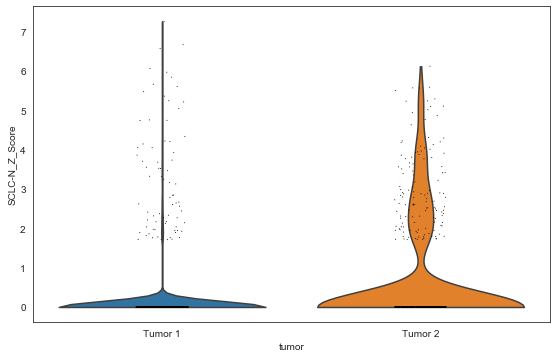

<Figure size 576x432 with 0 Axes>

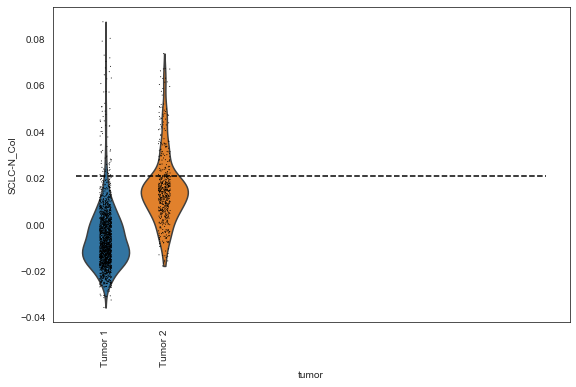

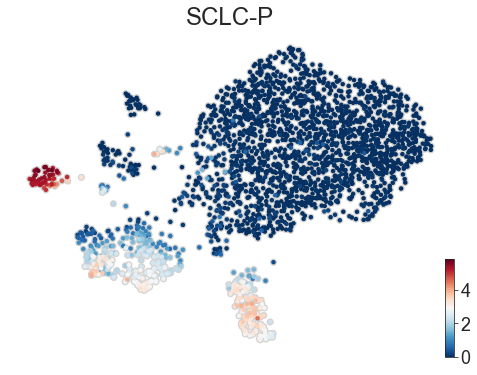

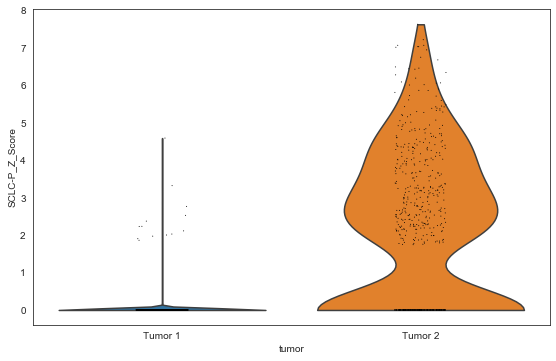

<Figure size 576x432 with 0 Axes>

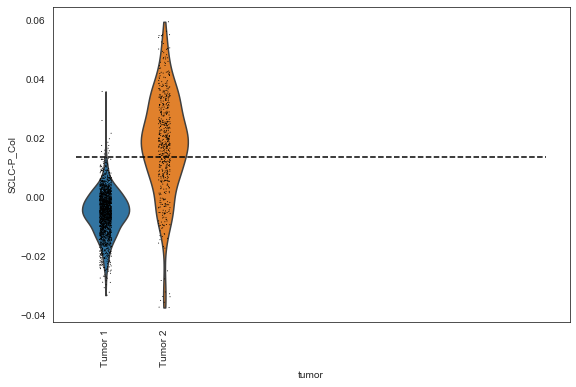

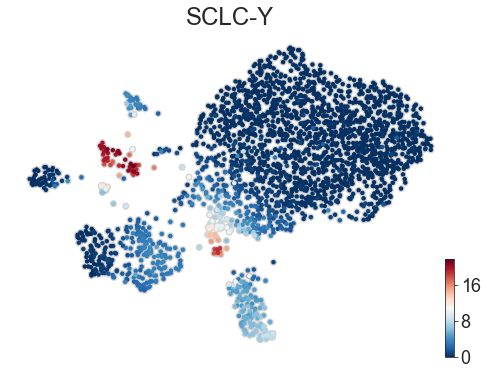

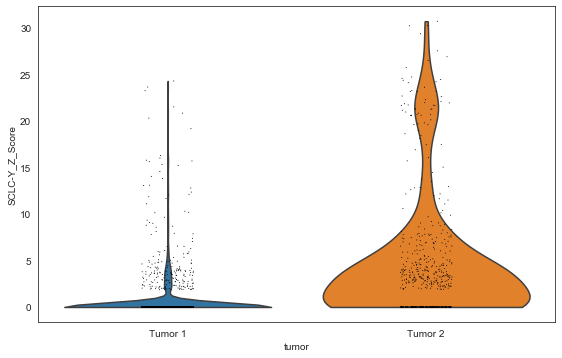

<Figure size 576x432 with 0 Axes>

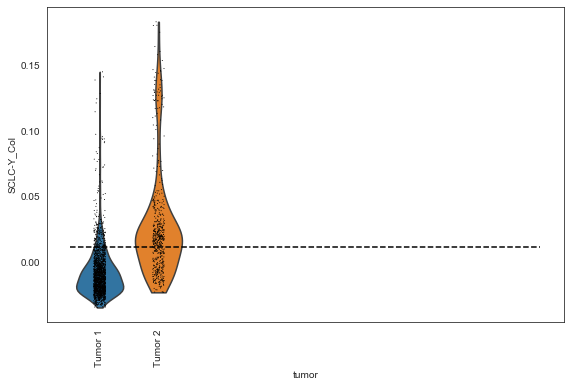

In [4]:
mb.ar.signature_scoring(adata, sig_matrix, basis = 'umap', num_bg = 5,threshold = .05, correction = None,
                        groupby = 'tumor')




<Figure size 3000x3600 with 0 Axes>

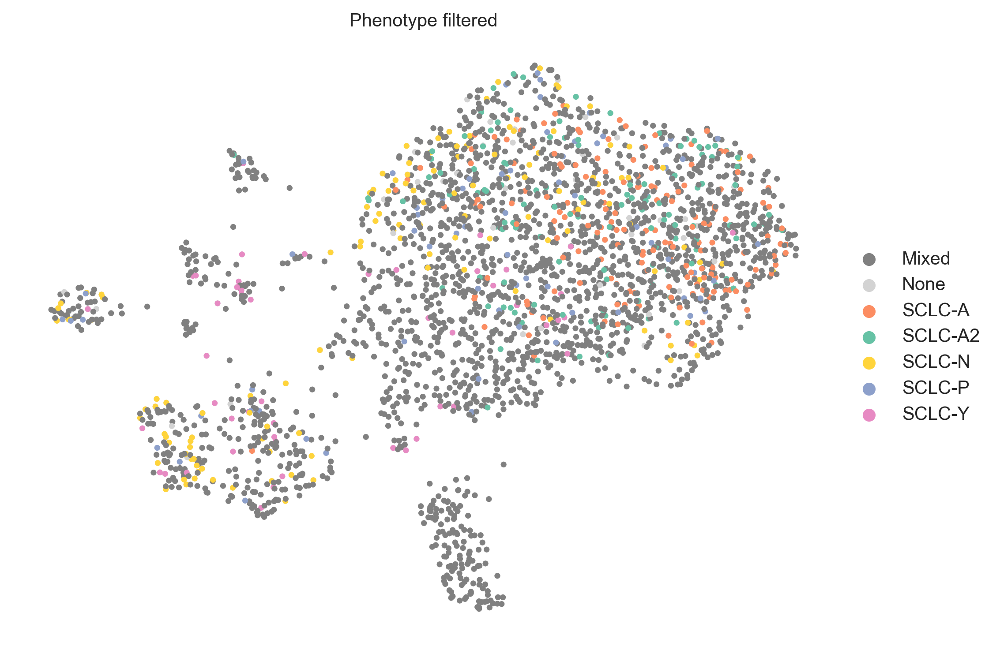

In [10]:
mb.ar.subtype_cells(adata,sig_matrix, basis = 'umap', score_name='Score')


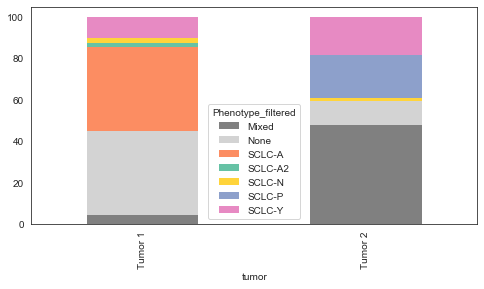

In [7]:
import matplotlib.pyplot as plt
custom_palette = ['grey','lightgrey','#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']

plt.rcParams["figure.figsize"] = [8, 4]
((pd.crosstab(adata.obs['tumor'], adata.obs['Phenotype_filtered']).T/
  pd.crosstab(adata.obs['tumor'], adata.obs['Phenotype_filtered']).sum(axis = 1))*100).T.plot(kind = 'bar',stacked = True,linewidth = 0,color = custom_palette)
# plt.savefig('barplot_rpm.pdf')


Tumor 1
Index(['SCLC-A_Score', 'SCLC-A2_Score', 'SCLC-N_Score'], dtype='object')


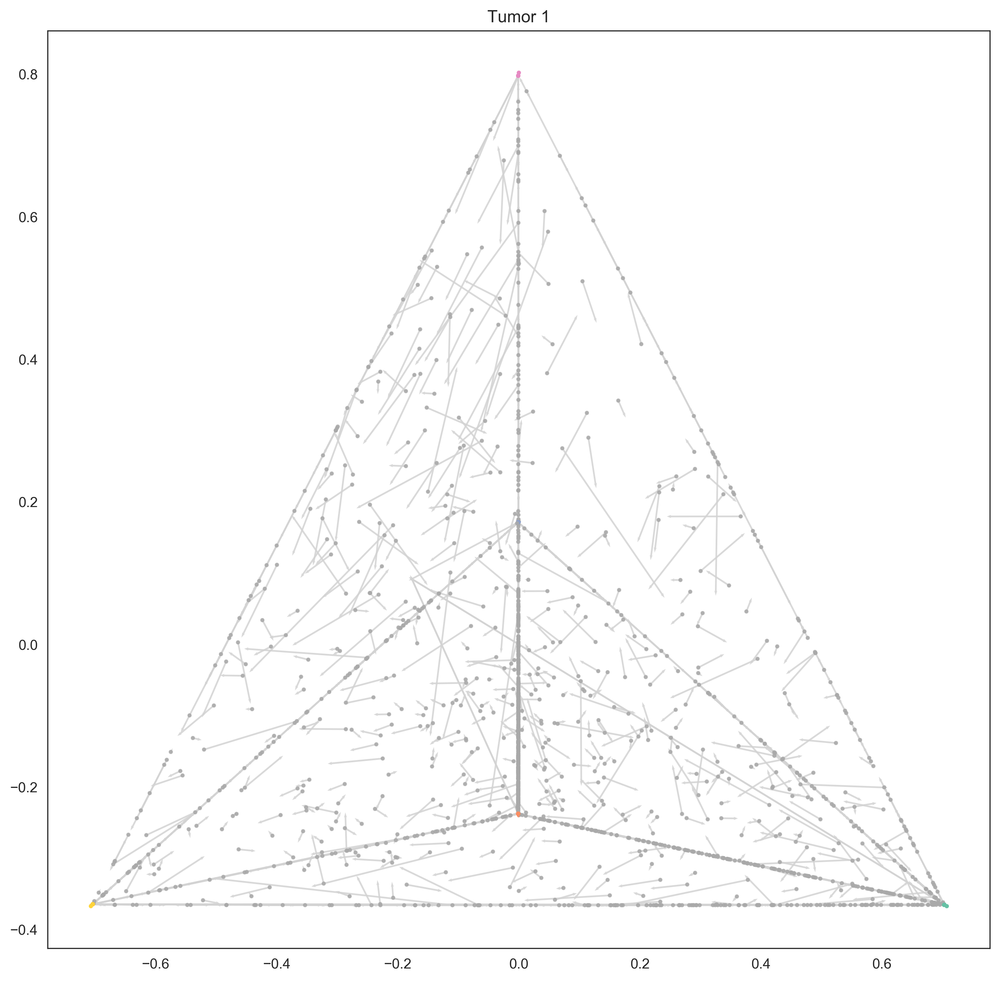

Tumor 2
Index(['SCLC-Y_Score', 'SCLC-P_Score', 'SCLC-N_Score'], dtype='object')


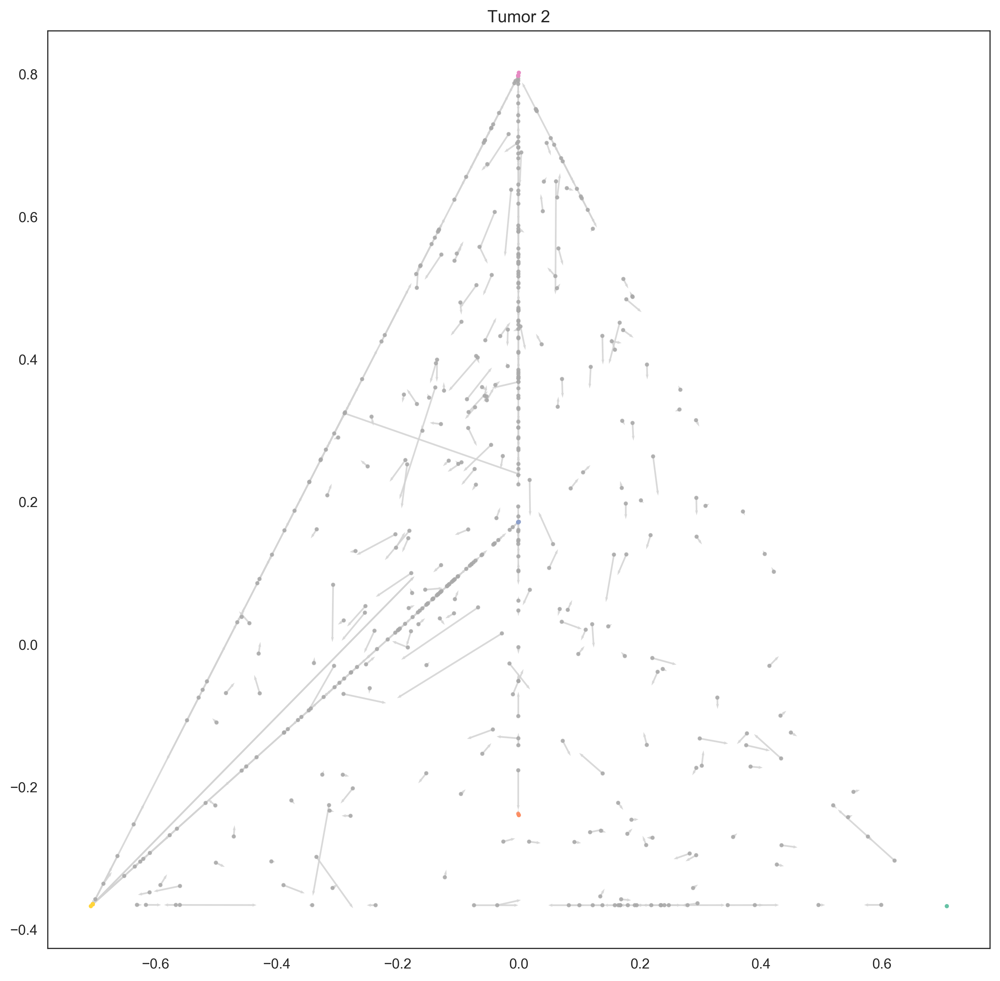

In [11]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Mixed': 'darkgray', 'None': 'white'}
mb.pl.archetype_diagrams(adata, sig_matrix, color_dict=color_dict, groupby='tumor',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'],color = 'Phenotype_filtered',norm = 'scale',
                        multiplier=1, figsize=(12,12), score_name = '_Score', alpha = .8, s = 4, sizes = 8, arrows = True)



Tumor 1
Index(['SCLC-A_Z_Score', 'SCLC-Y_Z_Score', 'SCLC-A2_Z_Score'], dtype='object')
[9.165460684997589, 81.04196816208393, 27.496382054992765, 39.556198745779064, 59.3342981186686]


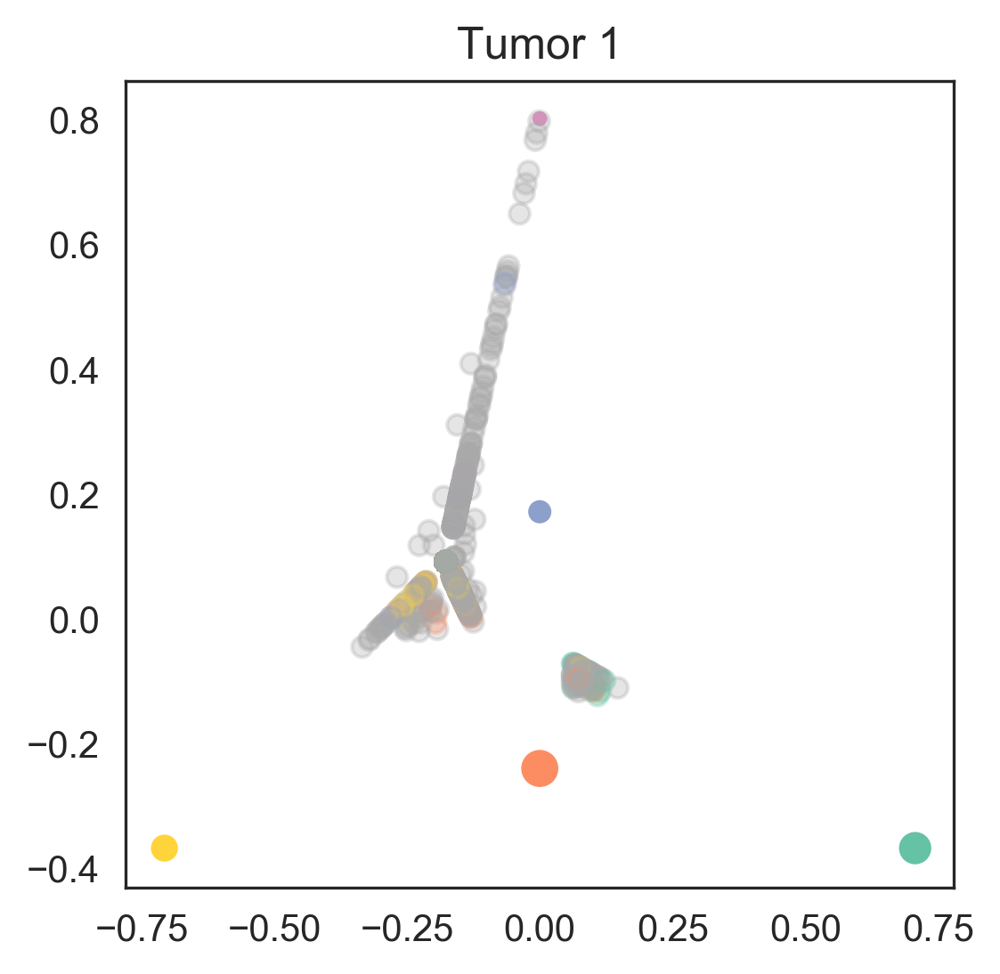

[9.165460684997589, 81.04196816208393, 27.496382054992765, 39.556198745779064, 59.3342981186686]


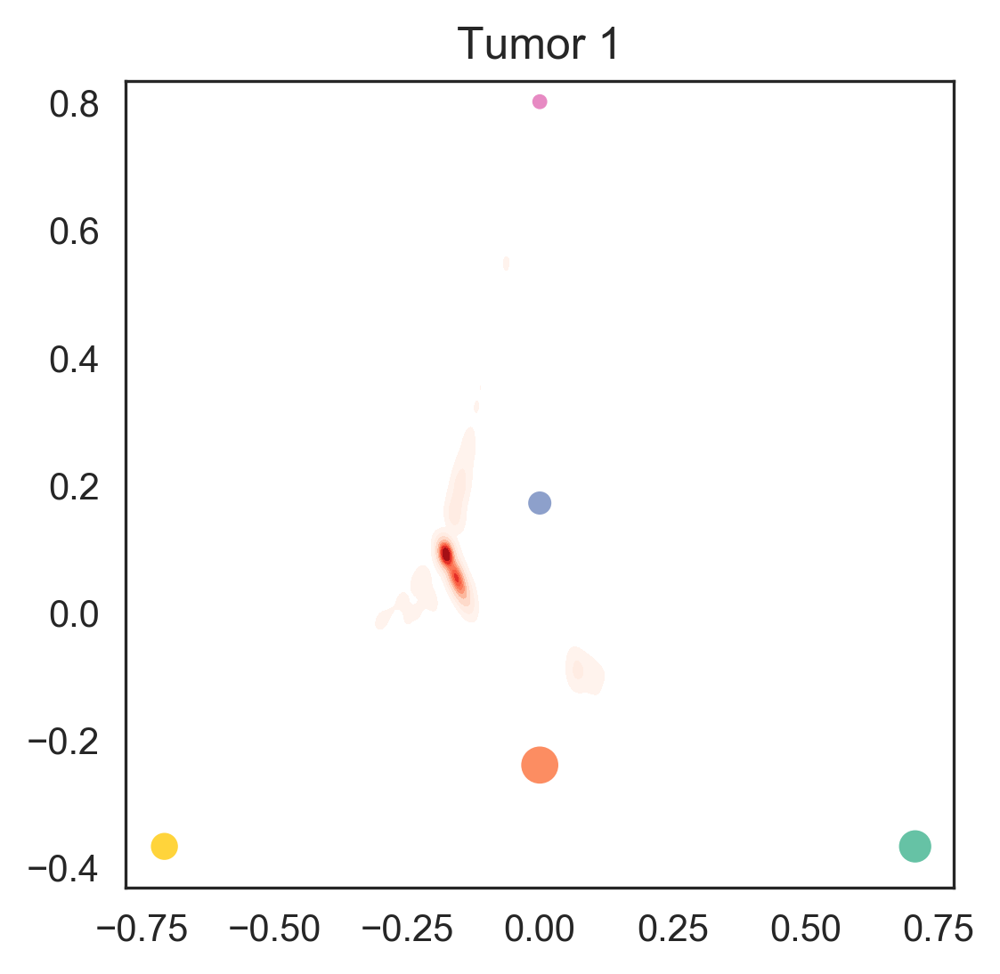

Tumor 2
Index(['SCLC-Y_Z_Score', 'SCLC-P_Z_Score', 'SCLC-N_Z_Score'], dtype='object')
[53.191489361702125, 1.7730496453900708, 23.04964539007092, 88.65248226950355, 0.0]


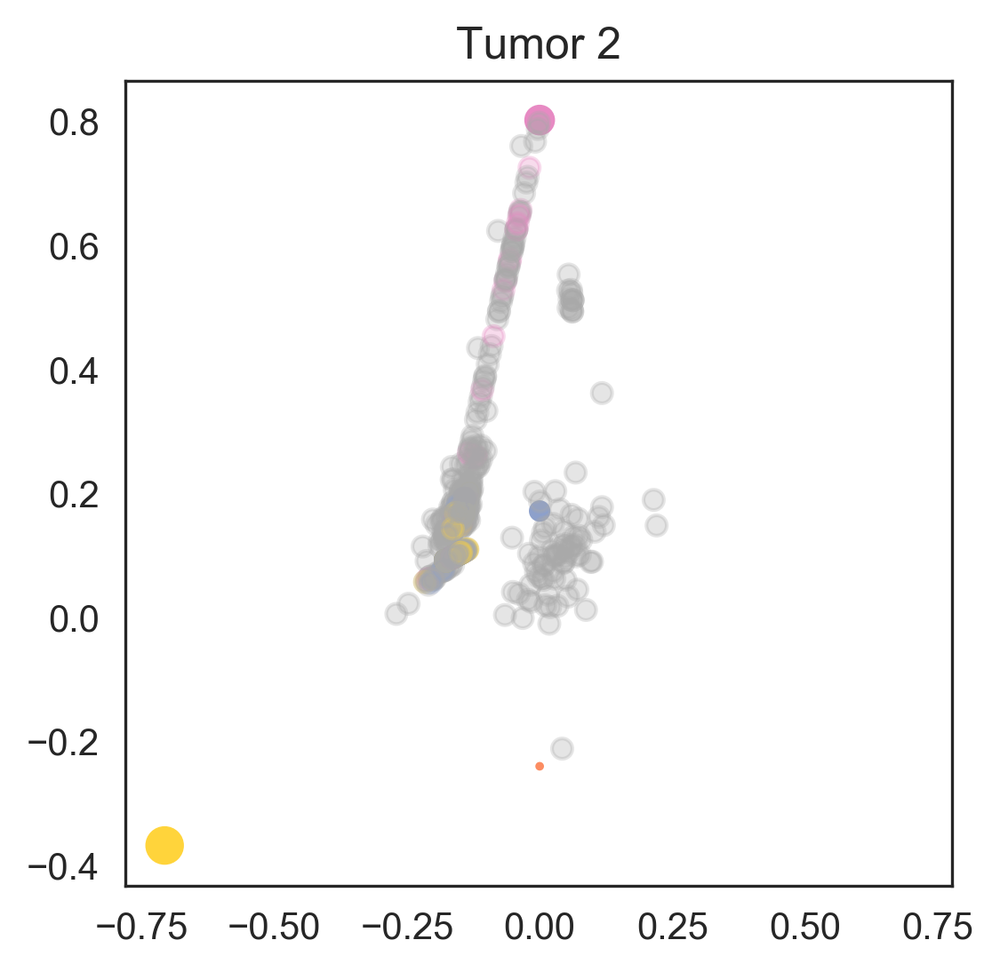

[53.191489361702125, 1.7730496453900708, 23.04964539007092, 88.65248226950355, 0.0]


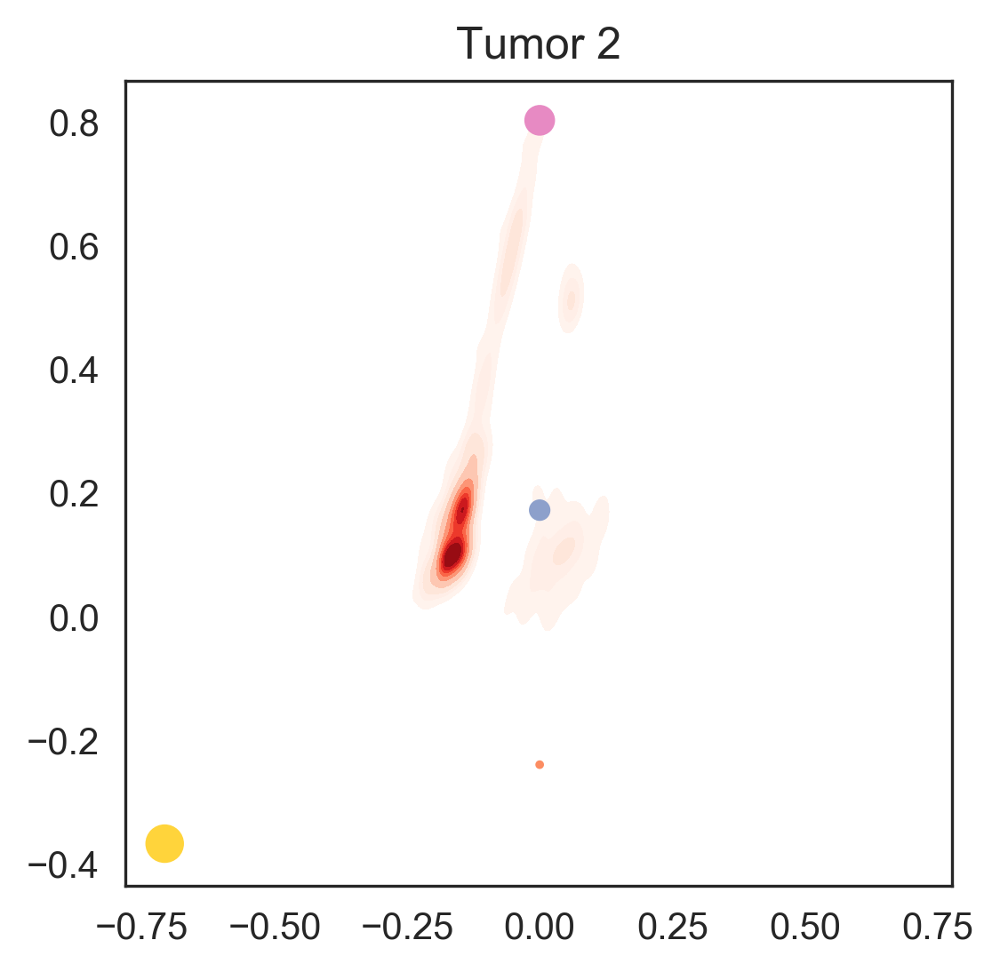

In [12]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Mixed': 'darkgray', 'None': 'white'}
mb.pl.archetype_diagrams(adata, sig_matrix, color_dict=color_dict, groupby='tumor',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'],
                        multiplier=1000, figsize=(4,4))



In [13]:
adata.write_h5ad('../int/tumor/adata05.h5ad')

In [1]:
adata = sc.read_h5ad('../int/tumor/adata05.h5ad')

NameError: name 'sc' is not defined

In [1]:
import mazebox as mb
import scvelo as scv
import scanpy as sc
import os.path as op
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
adata = sc.read_h5ad('../int/tumor/adata05.h5ad')
sig_matrix = pd.read_csv('../data/sig_matrix_ParTI.csv', header =0, index_col = 0)
sig_matrix = sig_matrix / np.linalg.norm(sig_matrix, axis=0)



In [3]:
adata, adata_small, sig_matrix2 =mb.ar.phenotyping_recipe(adata, sig_matrix,groupby = 'tumor')


Trying to set attribute `.obs` of view, copying.


Transforming tumor data...
Gene signature matrix now has shape:  (87, 5)
Tumor data shortened to genes in gene list...
(2584, 87)
Tumor data subsetting complete.


In [3]:
outdir_ = './out/'

data, sig_matrix1, adata_small, lanorm = mb.ar.transform_tumor_space(adata, sig_matrix, unlog=False, scale=False, type = None)


        # Transform velocity vectors
data_vel, sig_matrix2, adata_small = mb.ar.transform_vel(adata_small, sig_matrix1, scale=False, lanorm=lanorm)

# # Plot tumor data with velocity in cell type space
# for clust in range(4):
#     mb.pl.twodimplot_tumor(data=data,veldata= data_vel,adata= adata_small,gene_sig= sig_matrix2, celltype1 = clust, celltype2 = clust+1,
#                      save = False, dir_prefix = outdir_,
#                      tumor_clust_name='tumor')
#     mb.pl.twodimplot_tumor(data=data, veldata=data_vel, adata=adata_small, gene_sig=sig_matrix2, celltype1=clust, celltype2=clust + 1,
#                      save=False, dir_prefix=outdir_,
#                      meanonly = True, tumor_clust_name='cline')

Trying to set attribute `.obs` of view, copying.


Transforming tumor data...
Gene signature matrix now has shape:  (87, 5)
Tumor data shortened to genes in gene list...
(2584, 87)
Tumor data subsetting complete.


In [4]:
data.index = adata_small.obs_names
data.columns = sig_matrix.columns
for s in data:
    adata_small.obs[f"{s}_Score"] = data[s]
data_vel.index = adata_small.obs_names
data_vel.columns = sig_matrix.columns
for s in data_vel:
    adata_small.obs[f"{s}_Score_t1"] = data_vel[s] + data[s]

In [5]:
#filtered phenotype
pheno = []

for i,r in data.iterrows():
    test = r*(r>0)
    if test.max() < .1: pheno.append('None')

    elif test.max()>.5:
#     if (test/test.sum()).max()>.9:
        pheno.append(data.columns[test.argmax()])
    else: pheno.append('Generalist')
adata_small.obs['Phenotype'] = pheno

In [6]:
adata_small.obs['tumor'] = adata_small.obs['tumor'].astype('category')

Index(['SCLC-A_Score', 'SCLC-P_Score', 'SCLC-A2_Score'], dtype='object')


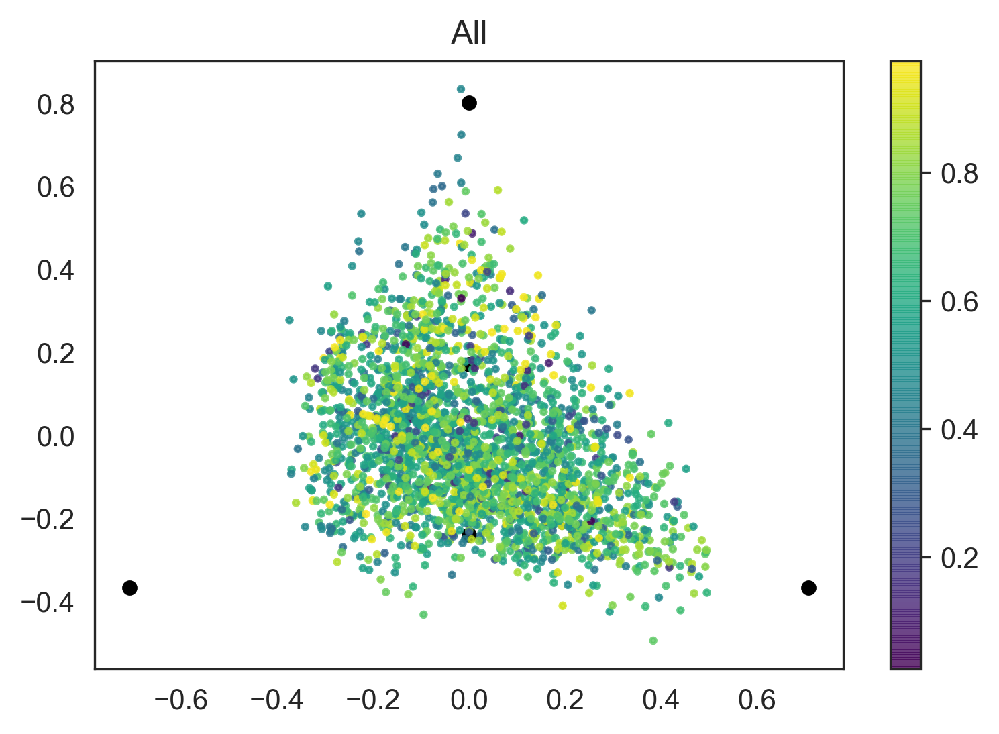

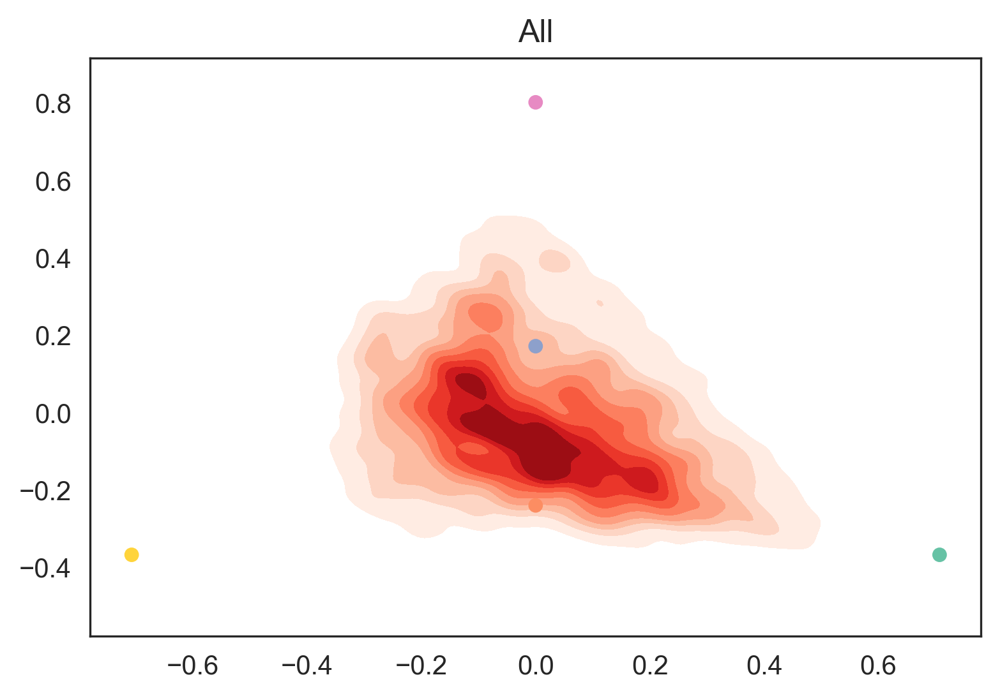

In [9]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgrey'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='None',color='velocity_confidence',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,
                        multiplier=1, figsize=(6,4), score_name = '_Score', alpha = .8, s = 4, sizes = 20)



In [16]:
cp = ['#a9a9a9','#d3d3d3','#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']

<AxesSubplot:xlabel='Phenotype', ylabel='velocity_confidence'>

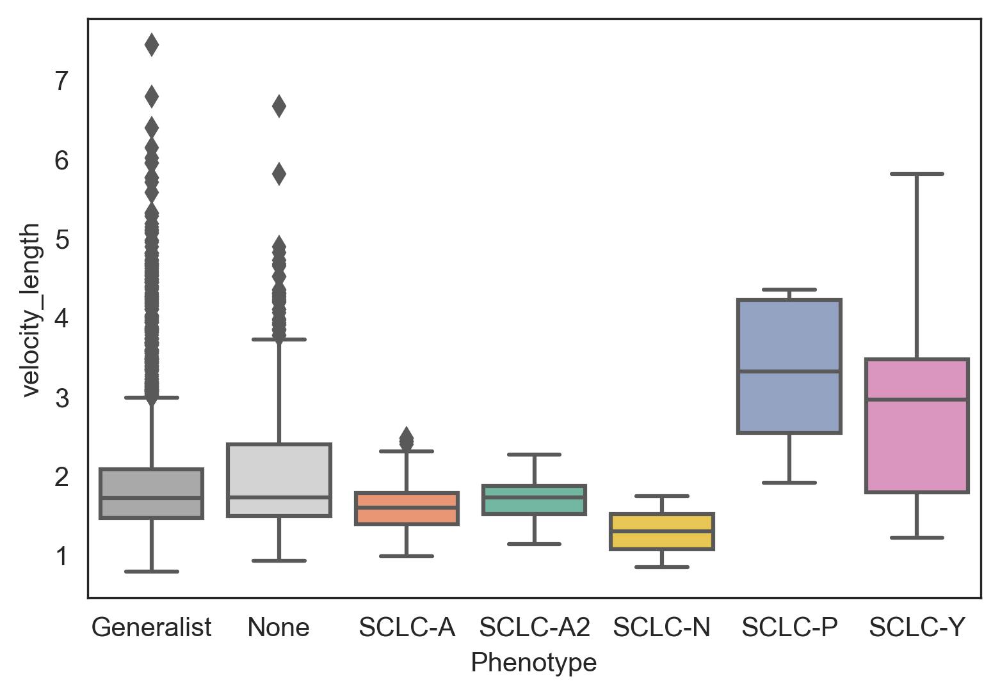

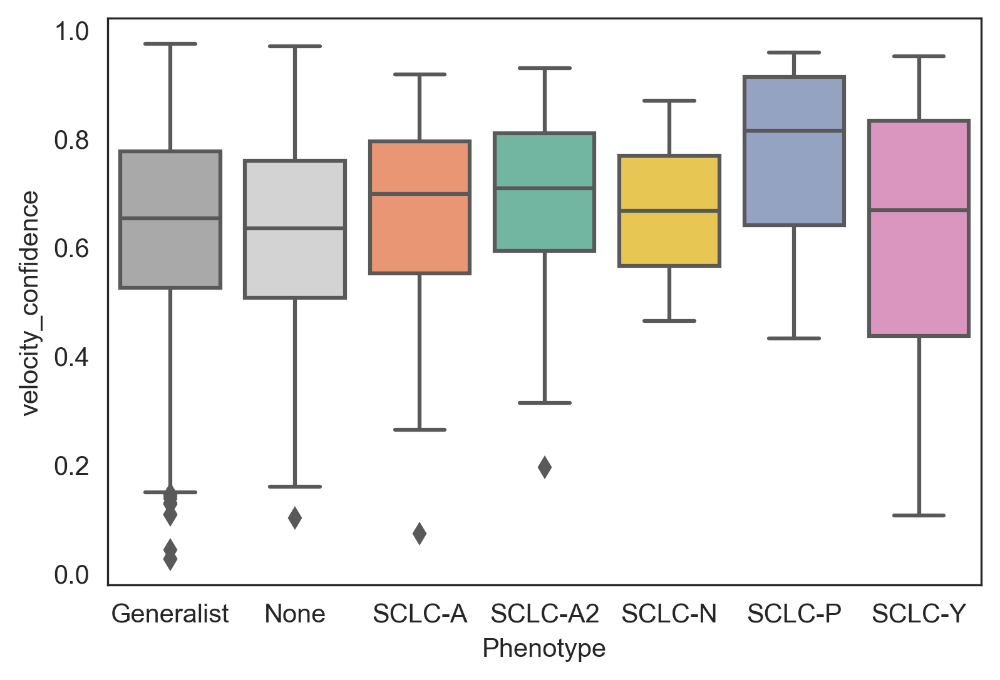

In [20]:
sns.boxplot(adata_small.obs['Phenotype'], adata_small.obs['velocity_length'], palette = cp,
           order = sorted(set(adata_small.obs['Phenotype'])))
plt.figure()
sns.boxplot(adata_small.obs['Phenotype'], adata_small.obs['velocity_confidence'], palette = cp,
                       order = sorted(set(adata_small.obs['Phenotype'])))




In [15]:
adata.obs['velocity_confidence'].median()

0.6533582210540771

(array([  3.,   1.,   4.,   8.,  12.,  13.,  16.,  20.,  32.,  33.,  46.,
         68.,  71., 116., 111., 138., 144., 181., 154., 166., 165., 182.,
        159., 183., 159., 160., 114.,  77.,  39.,  62.]),
 array([0.02579825, 0.05739935, 0.08900045, 0.12060156, 0.15220266,
        0.18380376, 0.21540487, 0.24700597, 0.27860708, 0.31020818,
        0.34180928, 0.37341039, 0.40501149, 0.43661259, 0.4682137 ,
        0.4998148 , 0.5314159 , 0.56301701, 0.59461811, 0.62621922,
        0.65782032, 0.68942142, 0.72102253, 0.75262363, 0.78422473,
        0.81582584, 0.84742694, 0.87902804, 0.91062915, 0.94223025,
        0.97383136]),
 <a list of 30 Patch objects>)

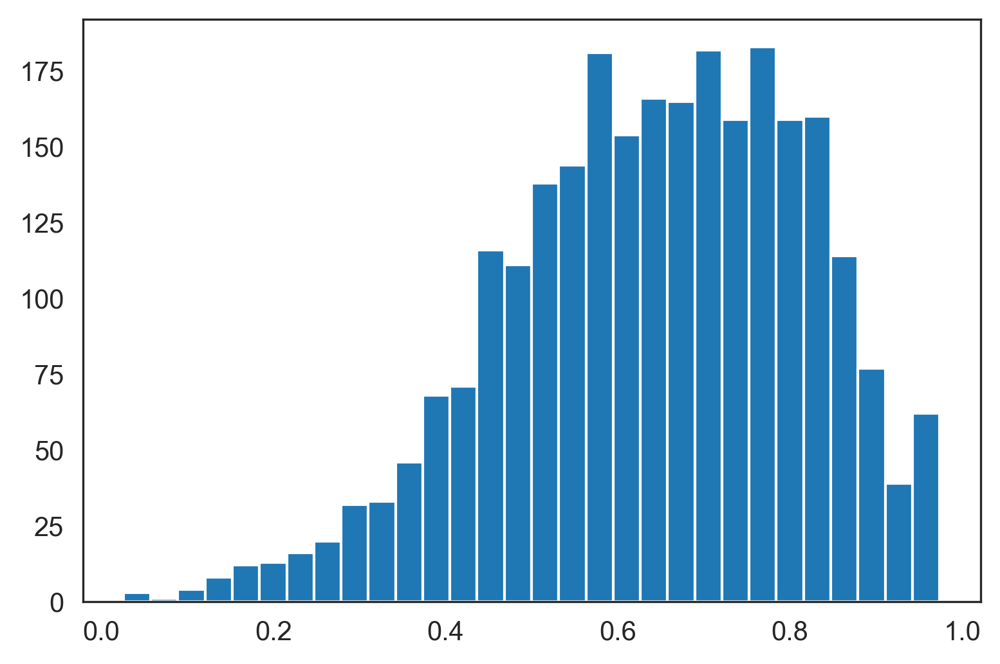

In [12]:
plt.hist(adata.obs['velocity_confidence'], bins = 30)

In [8]:
adata_small.obs['phase_score'] = adata_small.obs['G2M_score'] - adata_small.obs['S_score']

Index(['SCLC-A_Score', 'SCLC-P_Score', 'SCLC-A2_Score'], dtype='object')


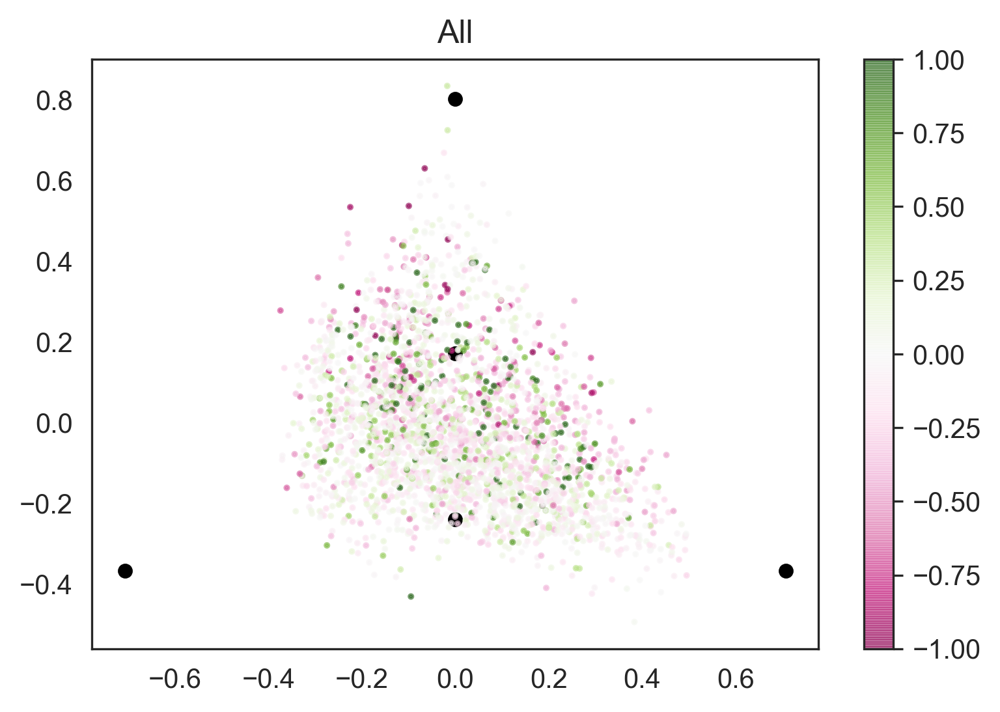

In [9]:
 import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgrey'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='None',color='phase_score',grid = False,
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,cmap = 'PiYG',
                        multiplier=1, figsize=(6,4), score_name = '_Score', alpha = .6, s = 2, sizes = 20)

Index(['SCLC-A_Score', 'SCLC-P_Score', 'SCLC-A2_Score'], dtype='object')


No handles with labels found to put in legend.


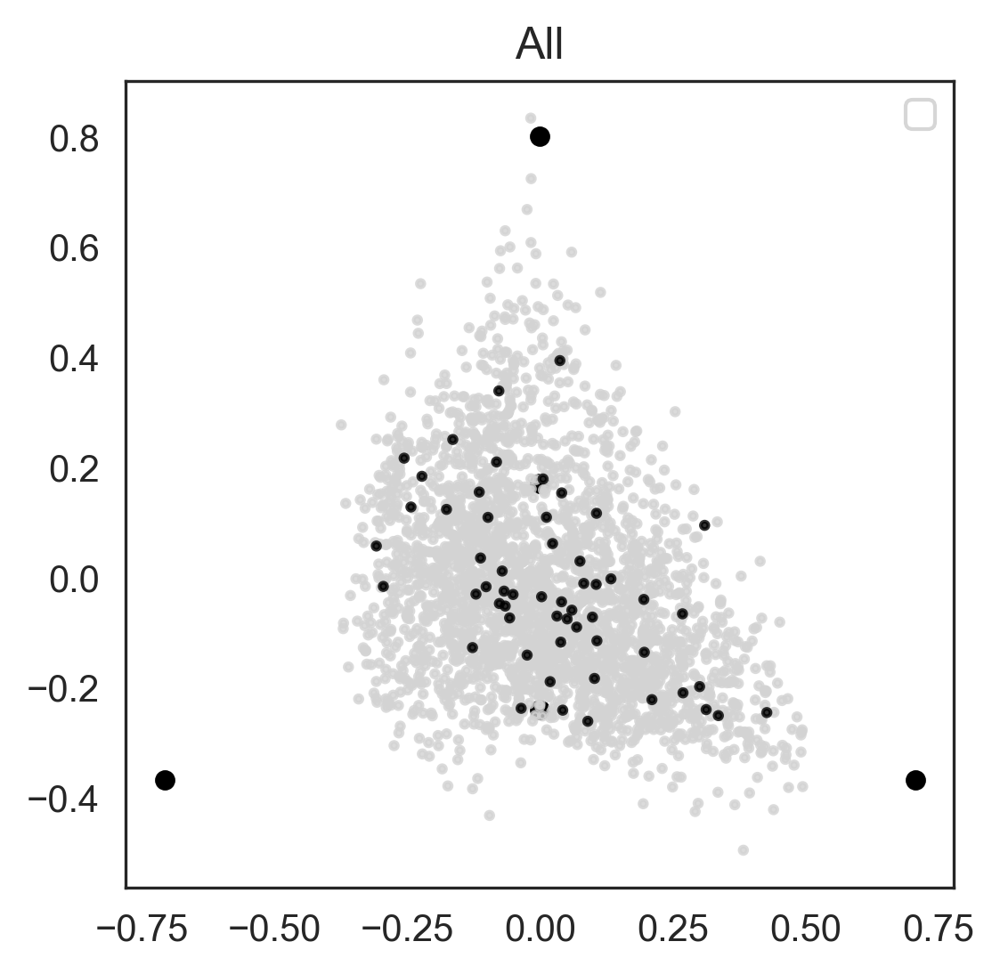

KeyError: 'SCLC-Y'

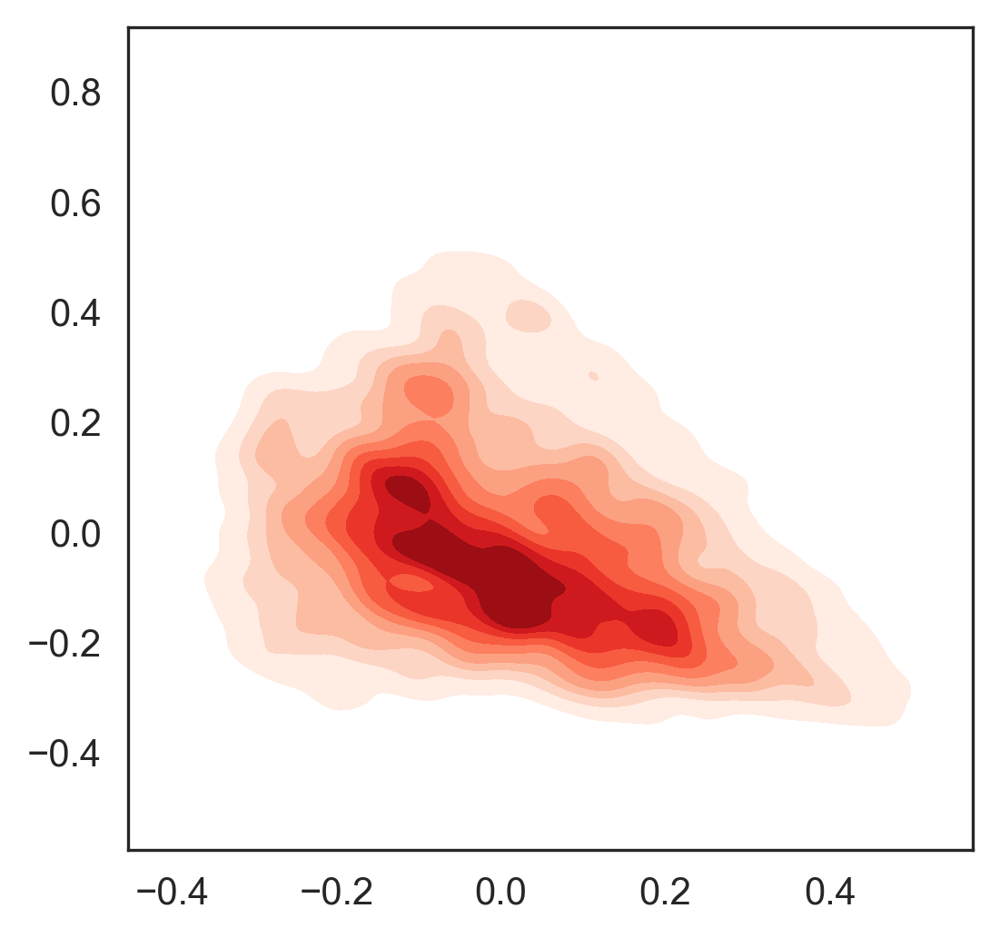

In [19]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgrey'}
color_dict = {'True':'black','False':'lightgrey'}

mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='None',color='absorbing',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,
                        multiplier=1, figsize=(4,4), score_name = '_Score', alpha = .8, s = 4, sizes = 20)



In [21]:
mb.pp.doublet_detections(adata,layer='matrix')
adata_small.obs['doublet_scores'] = adata.obs['doublet_scores']
adata_small.obs['predicted_doublets'] = adata.obs['predicted_doublets']

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.65
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 2.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.7%
Elapsed time: 1.5 seconds


Index(['SCLC-A_Score', 'SCLC-P_Score', 'SCLC-Y_Score'], dtype='object')


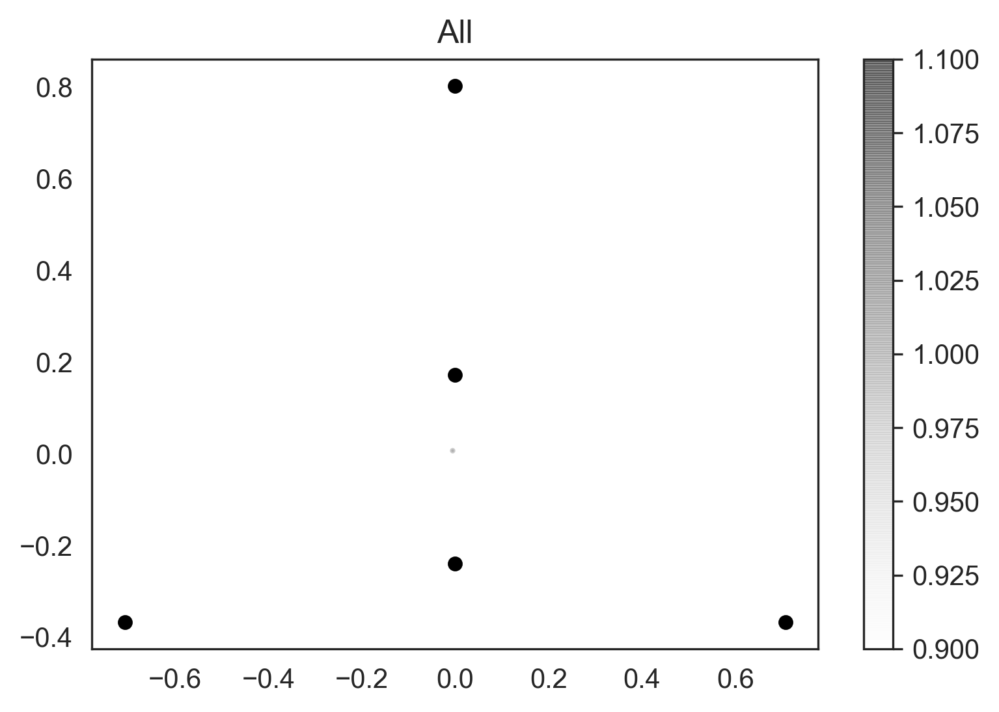

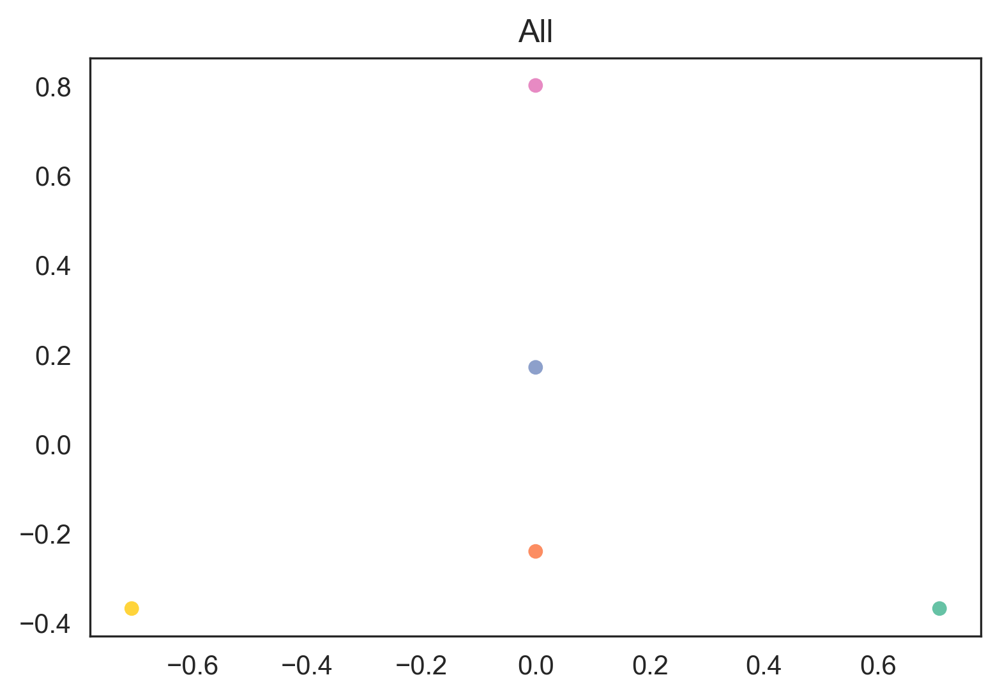

In [22]:

import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgrey'}
mb.pl.archetype_diagrams(adata_small[adata_small.obs['predicted_doublets'] == True], sig_matrix, color_dict=color_dict, groupby='None',color='predicted_doublets',grid = False,
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,cmap = 'Greys',
                        multiplier=1, figsize=(6,4), score_name = '_Score', alpha = .5, s = 1, sizes = 20)



In [23]:

plt.rcParams["figure.figsize"] = [8, 4]
((pd.crosstab(adata_small.obs['predicted_doublets'], adata_small.obs['Phenotype'])/
  pd.crosstab(adata_small.obs['predicted_doublets'], adata_small.obs['Phenotype']).sum(axis = 0))*100)

Phenotype,Generalist,None,SCLC-A,SCLC-A2,SCLC-N,SCLC-P,SCLC-Y
predicted_doublets,,,,,,,
False,99.950446,100.0,100.0,100.0,100.0,100.0,100.0
True,0.049554,0.0,0.0,0.0,0.0,0.0,0.0


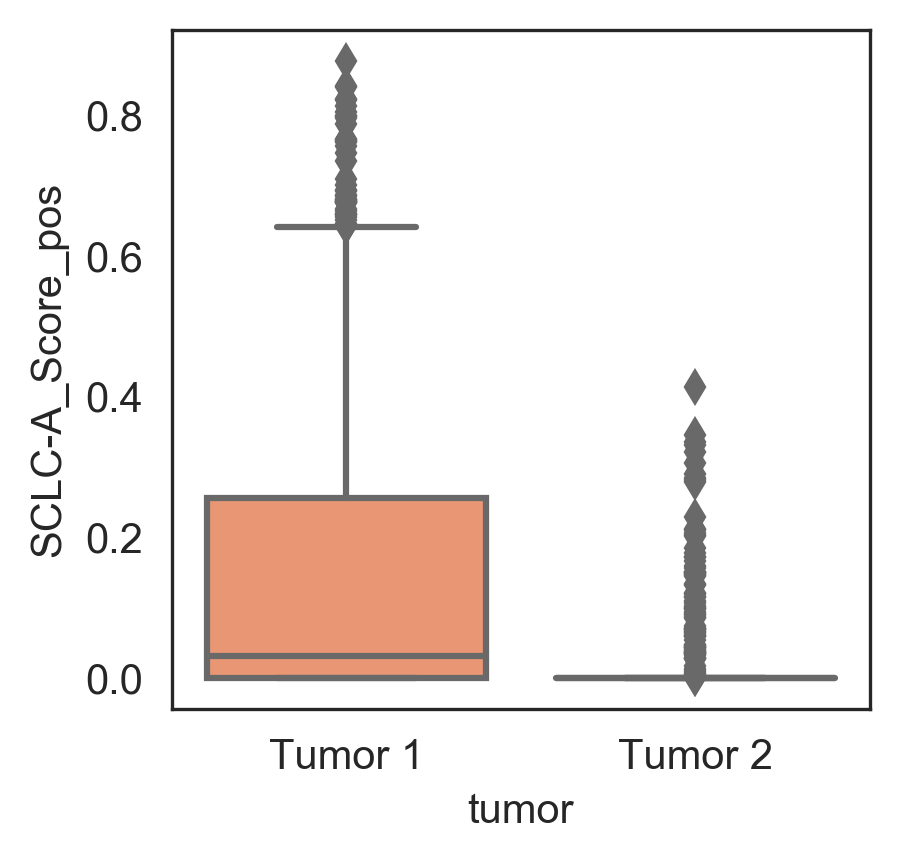

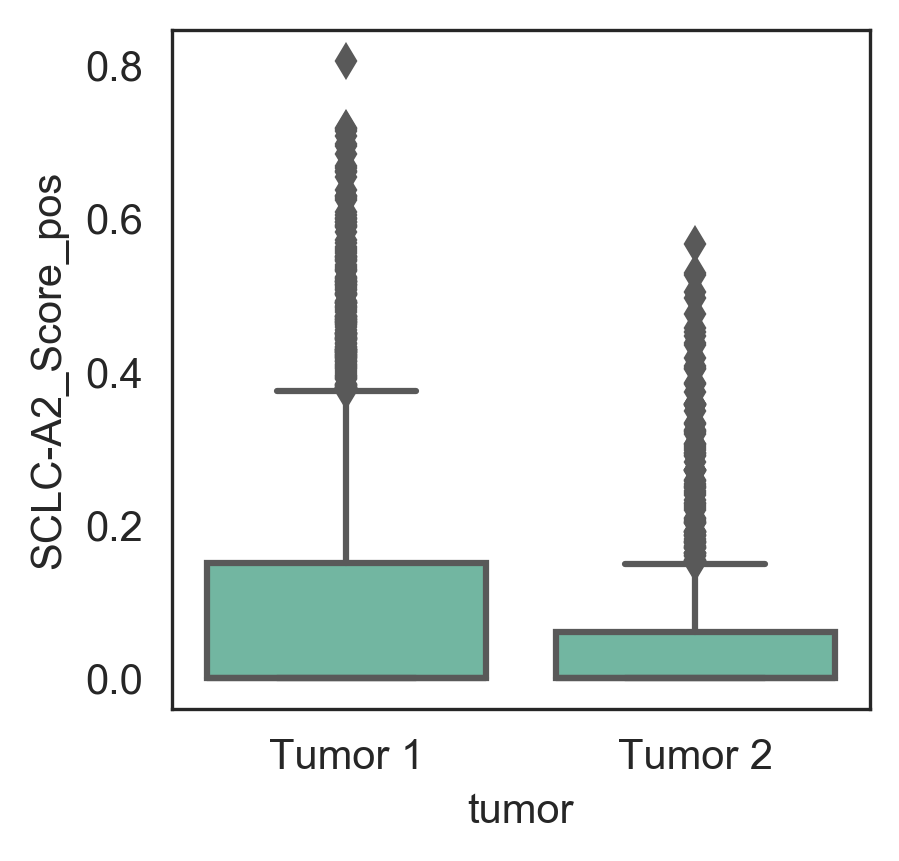

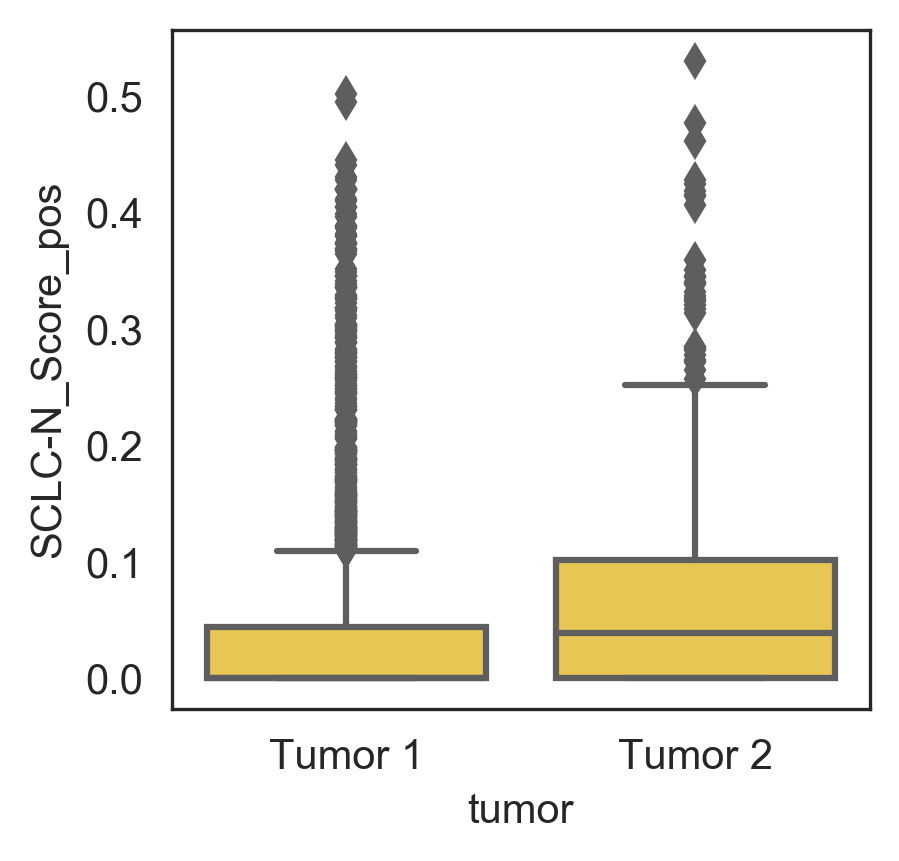

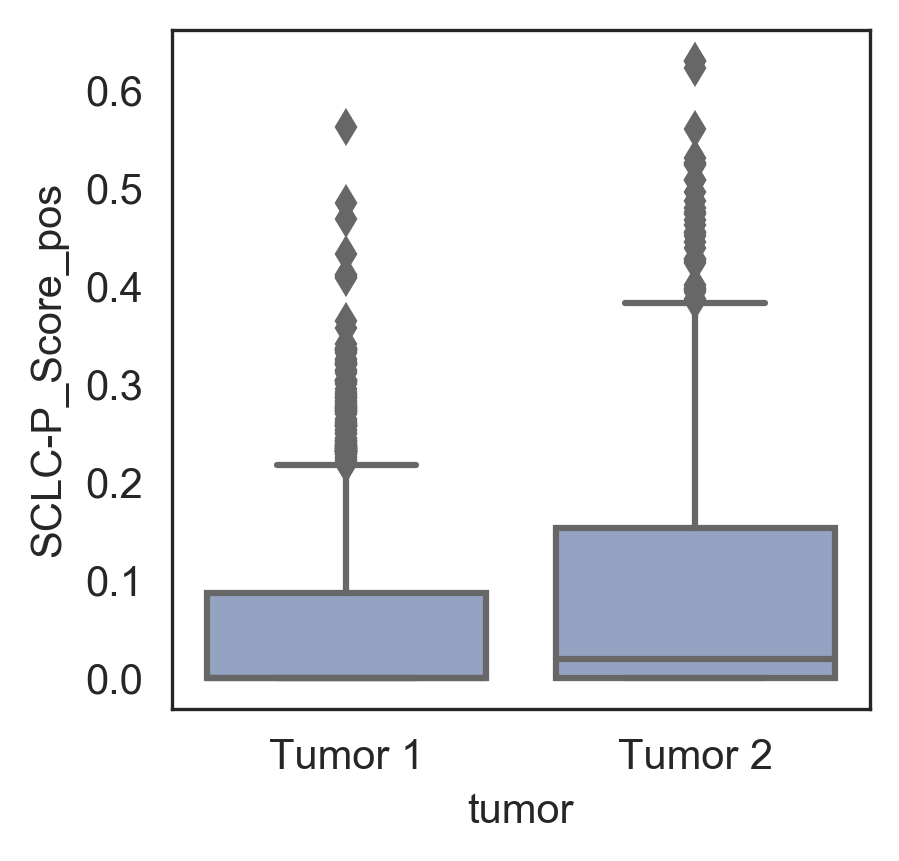

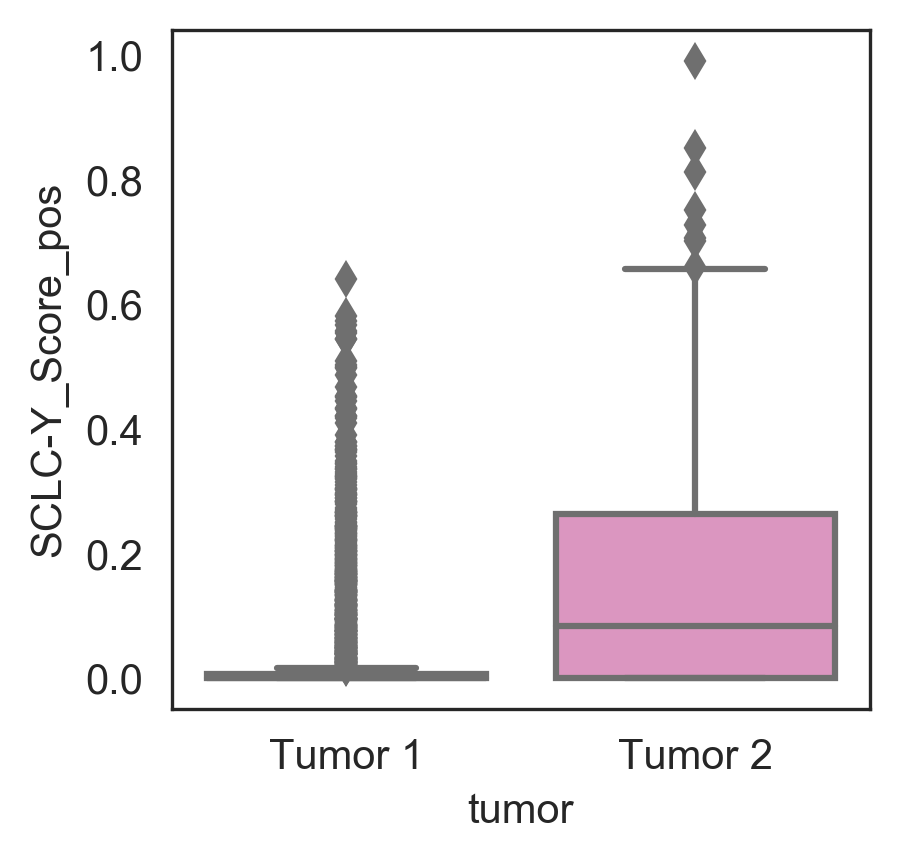

In [31]:
subtypes = ['SCLC-A_Score','SCLC-A2_Score','SCLC-N_Score','SCLC-P_Score','SCLC-Y_Score']

for x,i in enumerate(subtypes):
    adata_small.obs[f"{i}_pos"] = adata_small.obs[f"{i}"]*(adata_small.obs[f"{i}"]>0)
    plt.figure(figsize = (3,3))
    sns.boxplot(data = adata_small.obs, x = 'tumor',y=f"{i}_pos", color = cp[x])
    plt.savefig(f"./figures/{i}_htumor.pdf")

In [8]:
cp = ['#a9a9a9','#d3d3d3','#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']

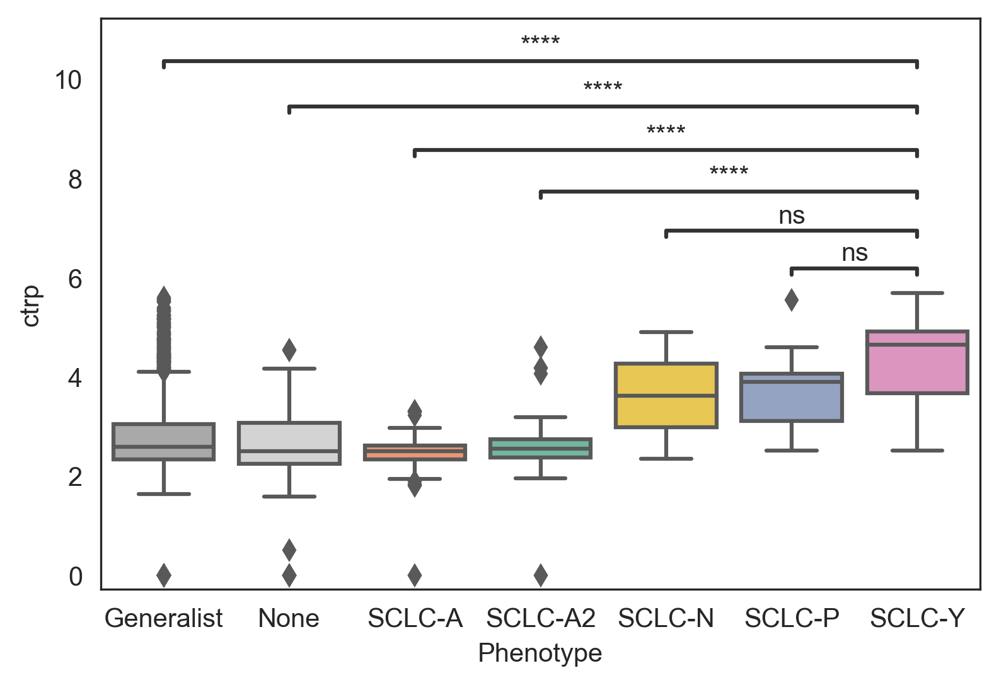

In [9]:
from statannot import add_stat_annotation

plt.figure(figsize=(6,4))
ax = sns.boxplot(data = adata_small.obs, x='Phenotype',y = 'ctrp',palette = cp,
                order = sorted(list(set(adata_small.obs['Phenotype']))))
add_stat_annotation(ax, data=adata_small.obs, x='Phenotype',y = 'ctrp',
                    order = sorted(list(set(adata_small.obs['Phenotype']))),
                    box_pairs=[('SCLC-Y','None'),
                              ('SCLC-Y','SCLC-A'), ("SCLC-Y", "SCLC-A2"),
                               ("SCLC-Y", "SCLC-N"),("SCLC-Y", "SCLC-P"),
                              ("Generalist", "SCLC-Y")],
                    test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
plt.savefig('./figures/ctrp_humantumor_phenotype.pdf')

Tumor 1
Index(['SCLC-A_Score', 'SCLC-A2_Score', 'SCLC-P_Score'], dtype='object')


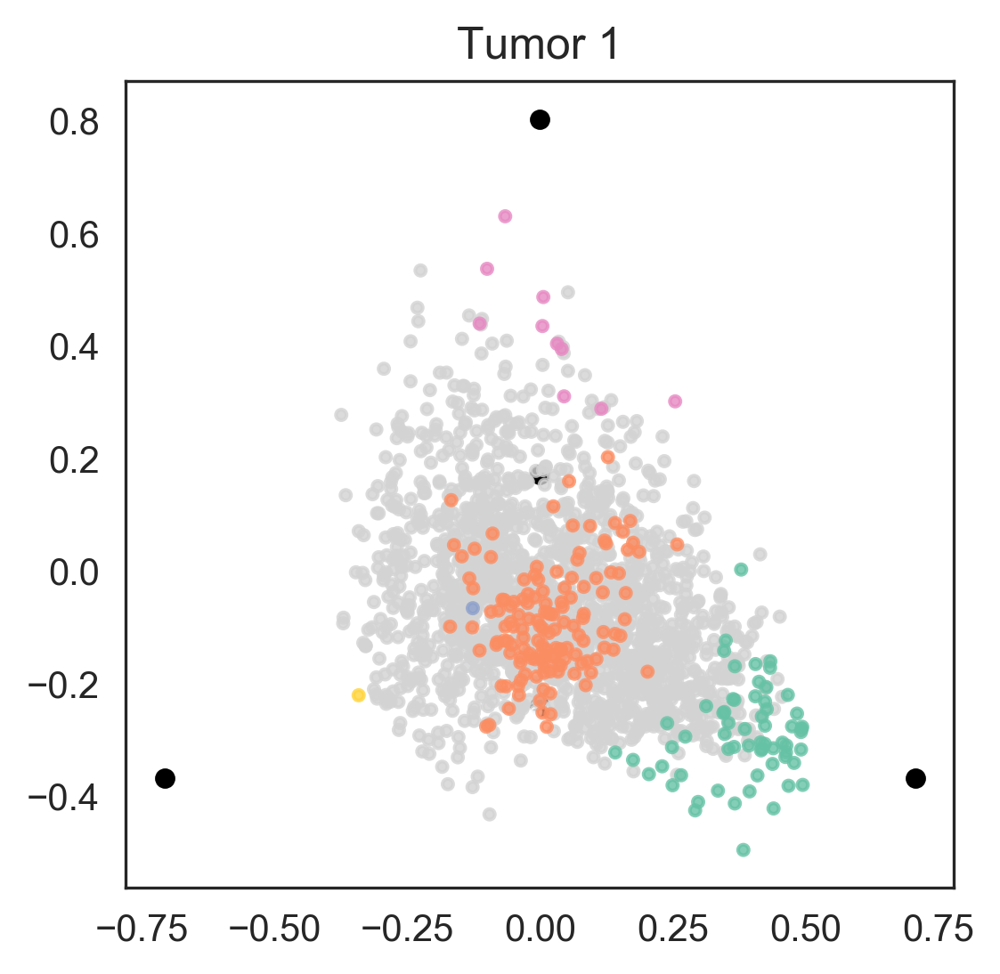

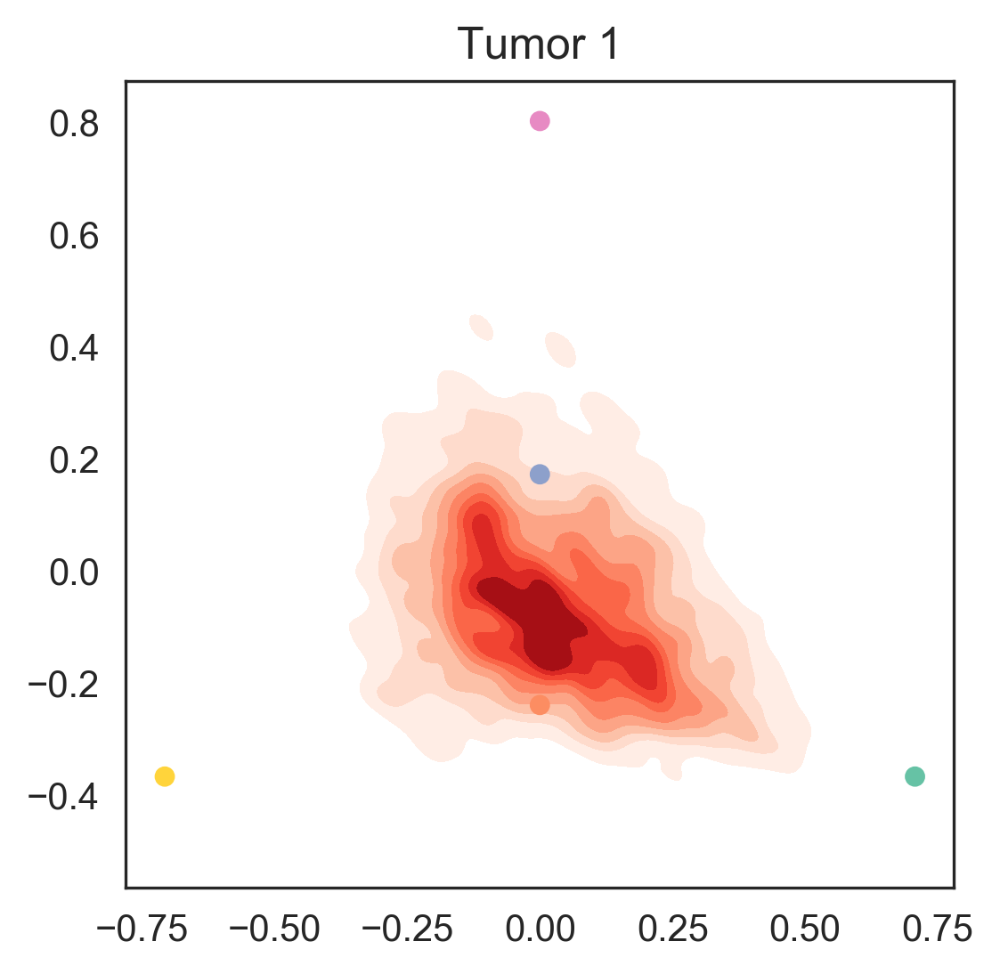

Tumor 2
Index(['SCLC-Y_Score', 'SCLC-P_Score', 'SCLC-N_Score'], dtype='object')


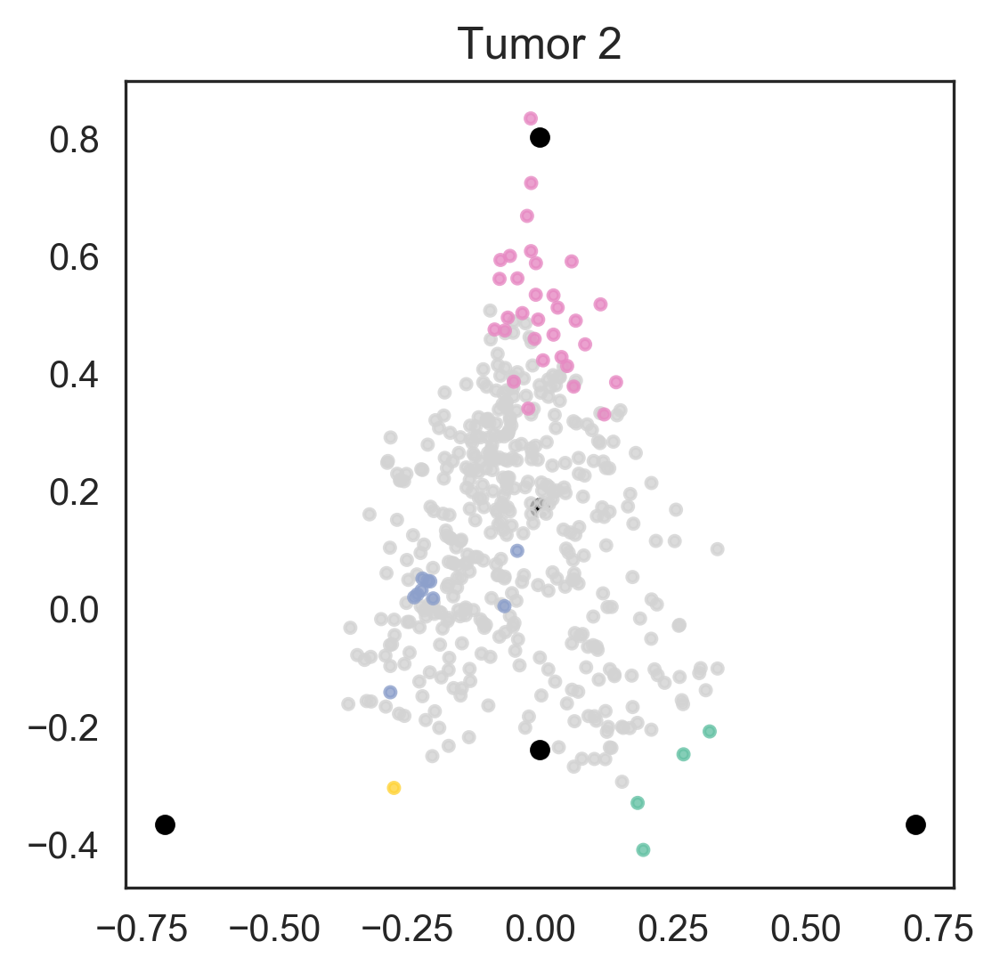

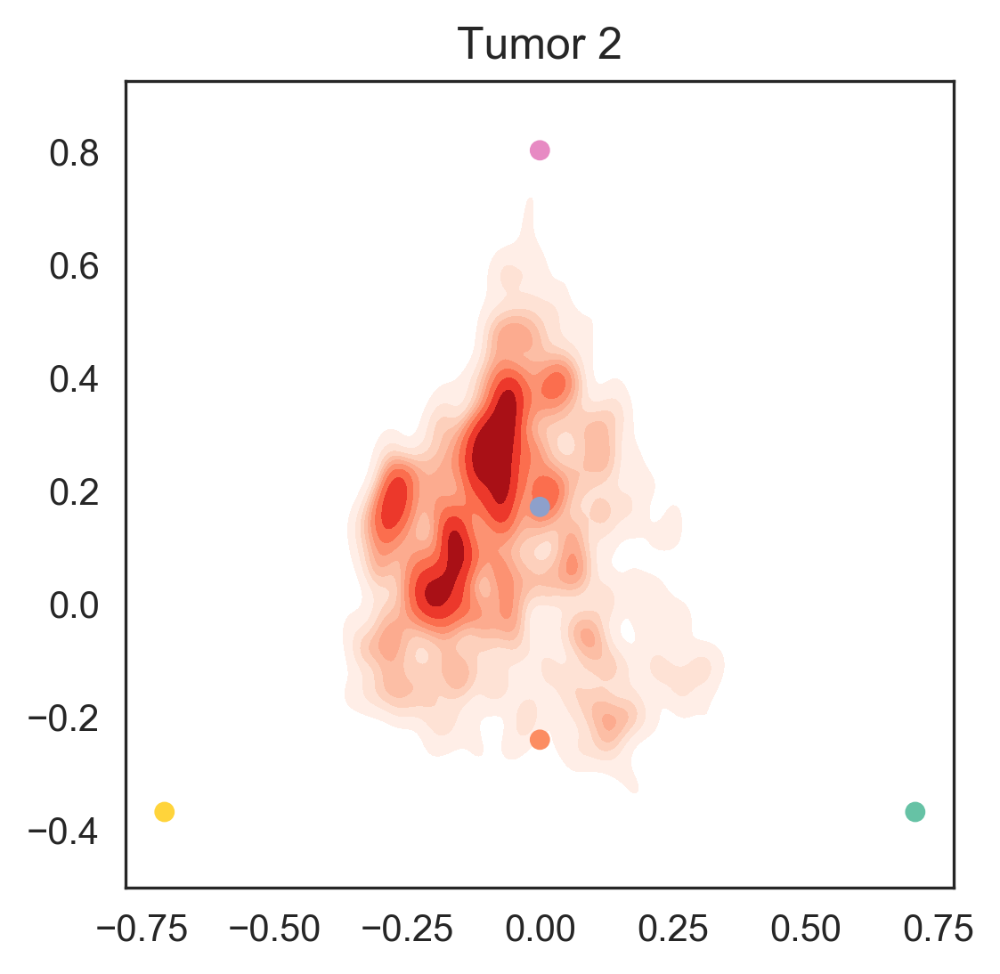

In [5]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'lightgrey', 'None': 'white'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='tumor',color = 'Phenotype',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',sizes = 20,
                        figsize=(4,4), score_name = '_Score', alpha = .8, s = 8, arrows = False)



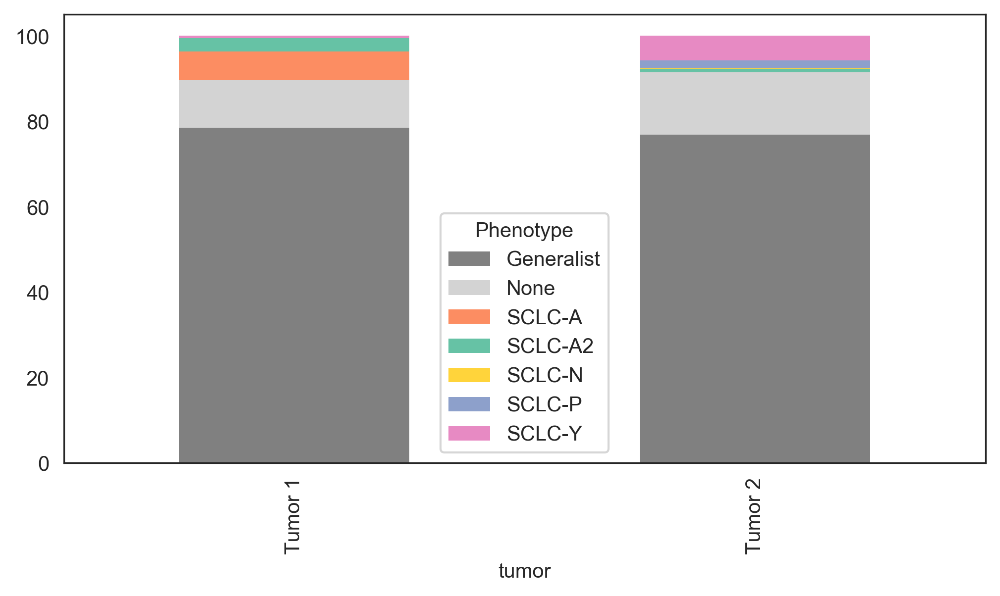

In [6]:
mb.pl.subtype_bar(adata_small,groupby='tumor', fname = 'tumor', pheno_name="Phenotype")



Tumor 1
Index(['SCLC-A_Score', 'SCLC-A2_Score', 'SCLC-P_Score'], dtype='object')


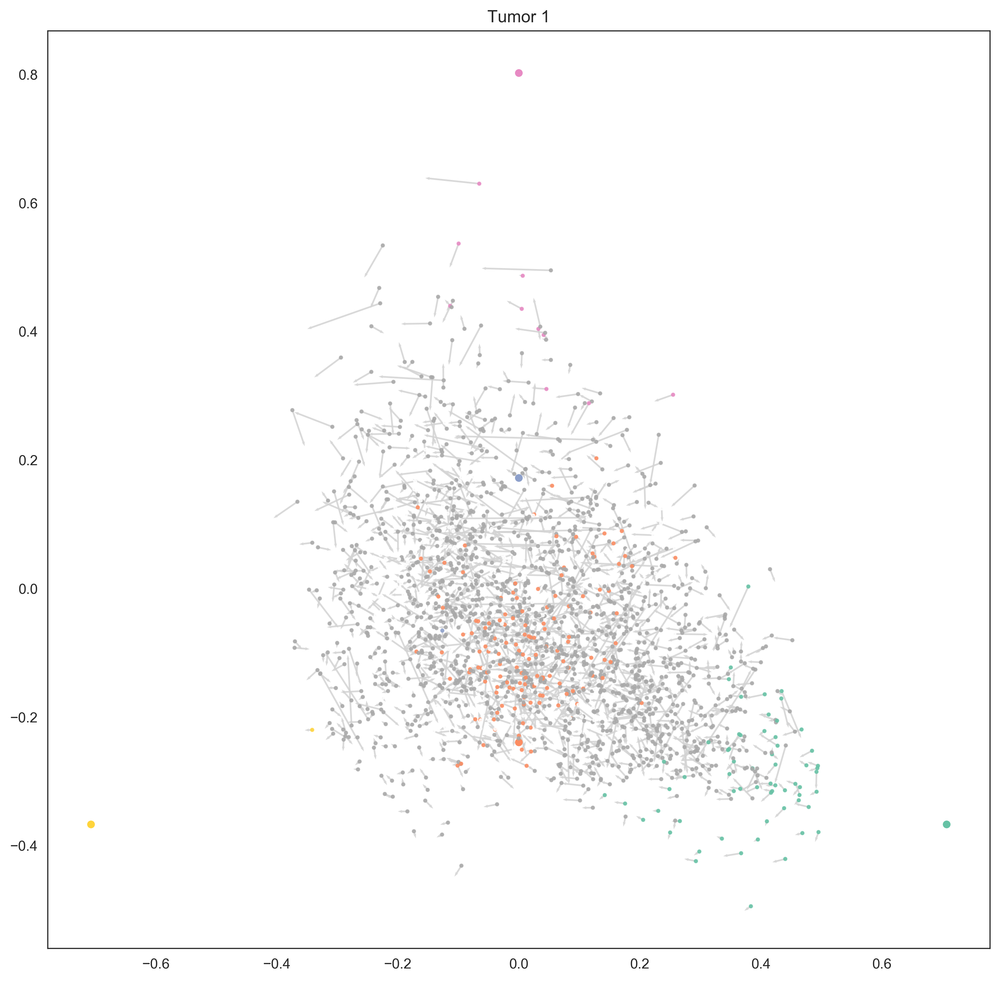

Tumor 2
Index(['SCLC-Y_Score', 'SCLC-P_Score', 'SCLC-N_Score'], dtype='object')


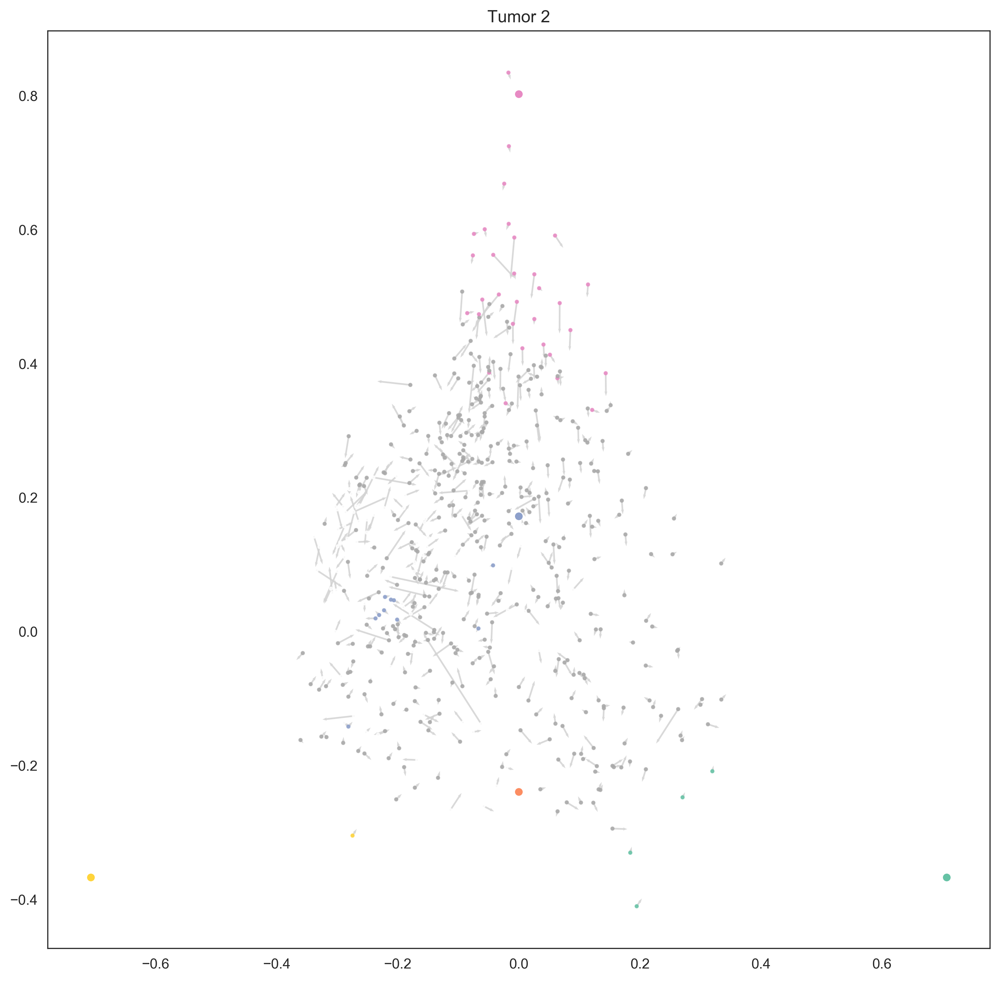

In [8]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'white'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='tumor',color = 'Phenotype',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',
                        multiplier=1, figsize=(12,12), score_name = '_Score', alpha = .8, s = 4, sizes = 20, arrows = True)



Index(['SCLC-A_Score', 'SCLC-P_Score', 'SCLC-A2_Score'], dtype='object')


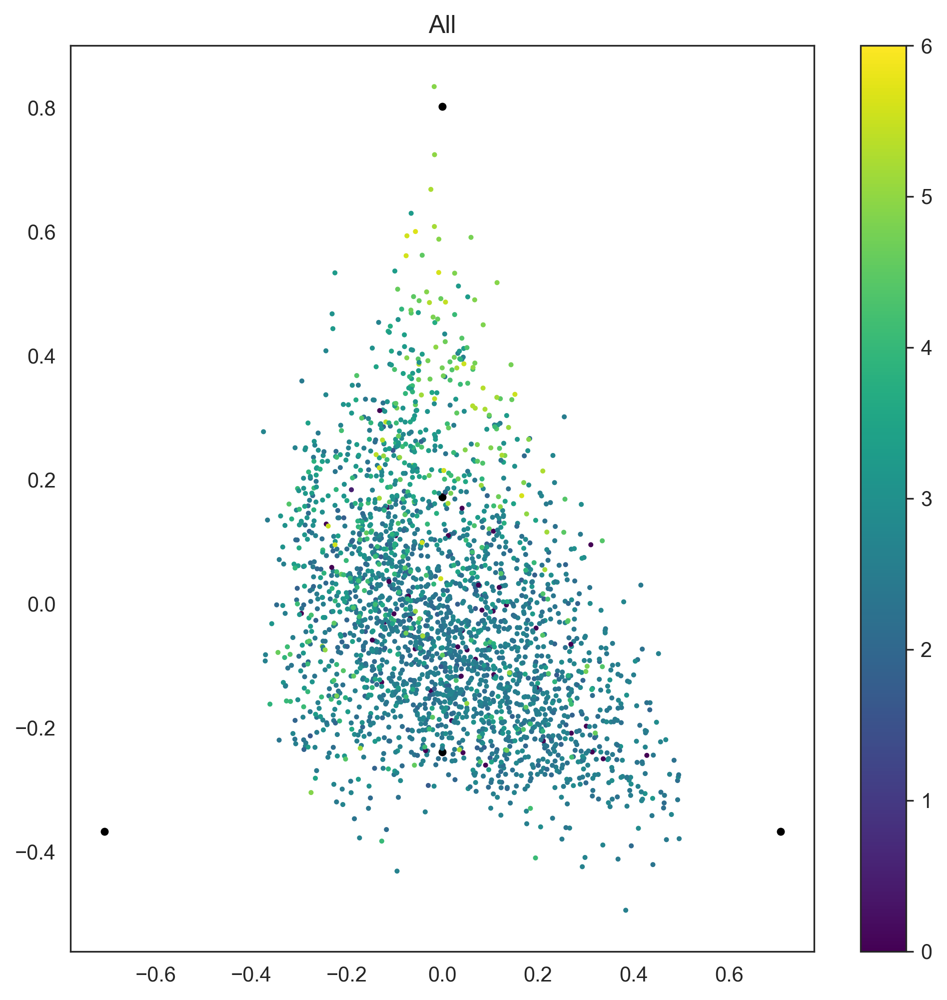

In [13]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Mixed': 'darkgray', 'None': 'white'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='None',norm = 'None',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'],color = 'ctrp',vmax = 6, vmin = 0,
                        multiplier=1, figsize=(8,8), score_name = '_Score', alpha = 1, s = 2, sizes = 8)



In [57]:
mb.pp.magic_recipe(adata, [i.capitalize() for i in tfs], 'Phenotype_filtered', fname='rpm')


Calculating MAGIC...
  Running MAGIC on 15257 cells and 21163 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 10.95 seconds.
    Calculating KNN search...
    Calculated KNN search in 33.19 seconds.
    Calculating affinities...
    Calculated affinities in 31.84 seconds.
  Calculated graph and diffusion operator in 76.00 seconds.
  Calculating imputation...
  Calculated imputation in 0.08 seconds.
Calculated MAGIC in 83.04 seconds.
Calculating PCA...
Calculated PCA in 9.02 seconds.
Calculating imputation...
Calculated imputation in 0.08 seconds.


In [8]:
adata.write_h5ad('../int/tumor/adata06.h5ad')

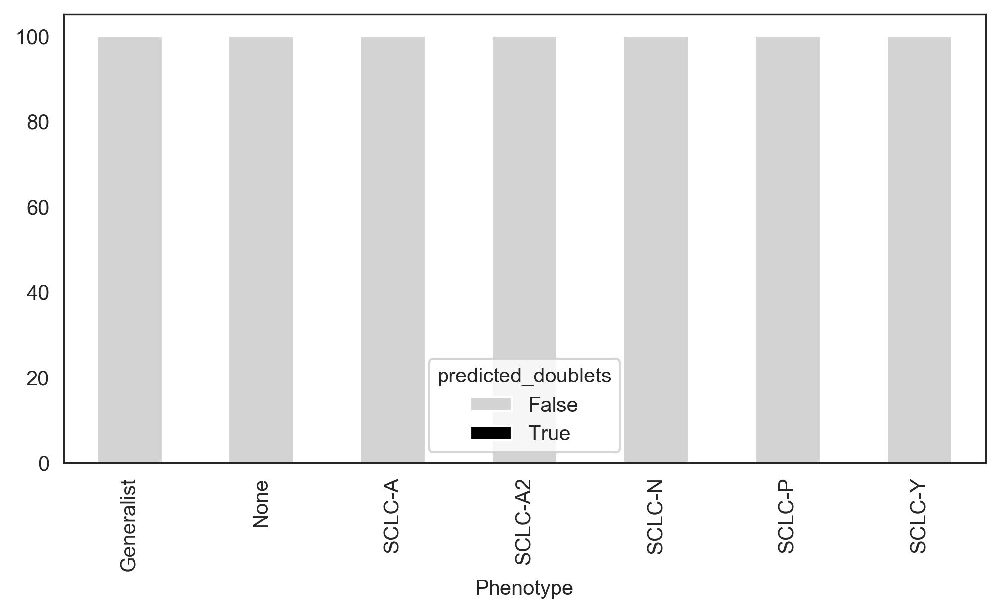

In [32]:
plt.rcParams["figure.figsize"] = [8, 4]
((pd.crosstab(adata_small.obs['predicted_doublets'], adata_small.obs['Phenotype'])/
  pd.crosstab(adata_small.obs['predicted_doublets'], adata_small.obs['Phenotype']).sum(axis = 0))*100).T.plot.bar(stacked = True,color = ['#d3d3d3','black'])
plt.savefig('./figures/tumor_doublets.pdf')

Index(['SCLC-A_Score', 'SCLC-P_Score', 'SCLC-A2_Score'], dtype='object')


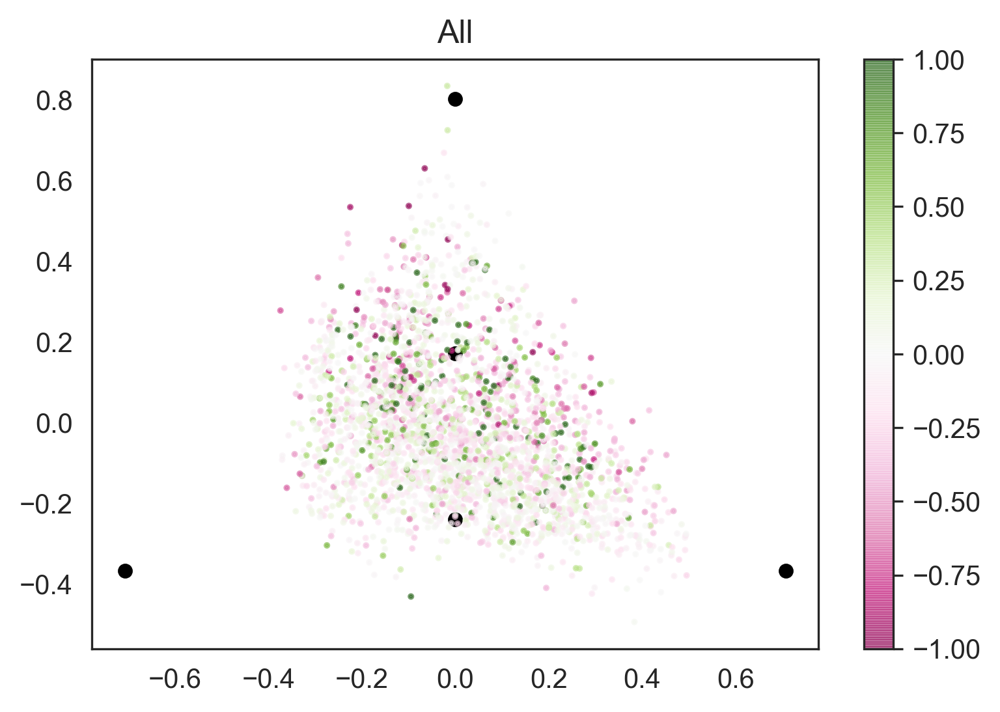

In [6]:
 import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
adata_small.obs['phase_score'] = adata.obs['G2M_score'] - adata.obs['S_score']
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgrey'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='None',color='phase_score',grid = False,
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,cmap = 'PiYG',
                        multiplier=1, figsize=(6,4), score_name = '_Score', alpha = .6, s = 2, sizes = 20, vmin = -1)

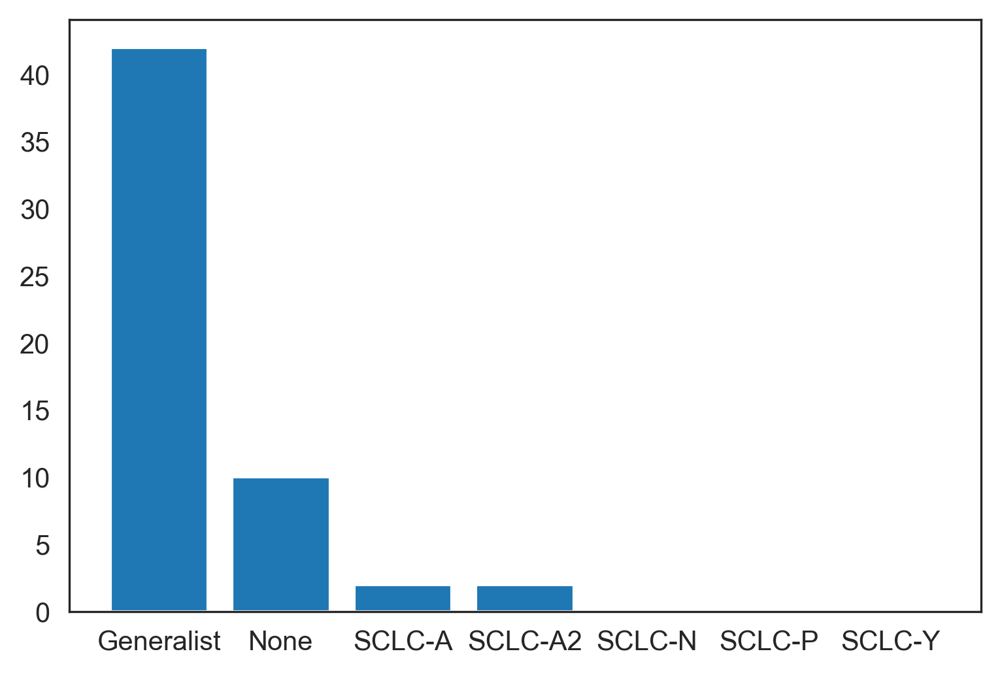

In [23]:
# f, (ax, ax2) = plt.subplots(2, 1, sharex=True, figsize = (6,4))

# plot the same data on both axes
plt.bar(pd.crosstab(adata_small.obs['Phenotype'], adata_small.obs['absorbing']).index, 
       pd.crosstab(adata_small.obs['Phenotype'], adata_small.obs['absorbing'])['True'])
# ax2.bar(pd.crosstab(adata_small.obs['Phenotype'], adata_small.obs['absorbing']).index, 
#        pd.crosstab(adata_small.obs['Phenotype'], adata_small.obs['absorbing'])['True'])
# zoom-in / limit the view to different portions of the data
ax.set_ylim(0, 50)  # outliers only
# ax2.set_ylim(0, 100)  # most of the data

# hide the spines between ax and ax2
ax.spines['bottom'].set_visible(False)
# ax2.spines['top'].set_visible(False)
ax.xaxis.tick_top()
ax.tick_params(labeltop=False)  # don't put tick labels at the top
# ax2.xaxis.tick_bottom()
plt.savefig('./figures/absorbing_tumors.pdf')